In [12]:
#%matplotlib widget

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy as sp
from scipy.special import jn
from sklearn.decomposition import PCA
#import jcamp as jc

<>:104: SyntaxWarning: invalid escape sequence '\c'
<>:104: SyntaxWarning: invalid escape sequence '\c'
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\4114112582.py:104: SyntaxWarning: invalid escape sequence '\c'
  filename = f"newData\cuso4\sample{i}.csv"


Successfully created a matrix with shape: (11001, 20)
(2, 1, 1000)
(1000, 1000)
(2, 1000)
(1000, 2)


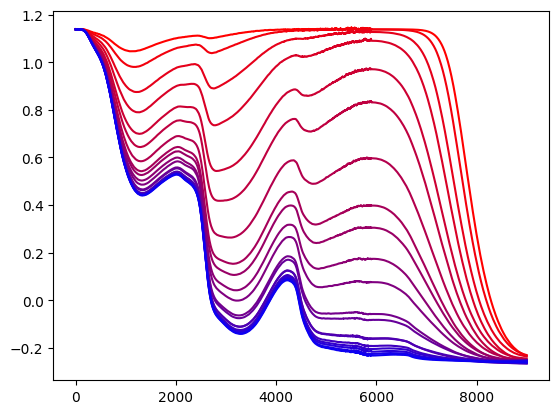

In [13]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

def generate_synthetic_data(data_matrix_a, C_real_2_a, num_new_points, error_std, kind='quadratic',sd=42):
    """
    Generates new labeled data points via interpolation with a controllable error term.
    
    Parameters:
    -----------
    data_matrix : numpy.ndarray
        Shape (11001, 20). The original feature matrix.
    C_real_2    : numpy.ndarray
        Shape (1, 20) or (20,). The concentration labels.
    num_new_points : int
        The number of new synthetic points to generate.
    error_std   : float
        The standard deviation of the Gaussian noise (controllable error term).
    kind        : str
        The type of interpolation ('linear', 'quadratic', 'cubic'). 
        'cubic' is recommended for smooth physical parameter families.
        
    Returns:
    --------
    synthetic_matrix : numpy.ndarray
        Shape (11001, num_new_points). The new interpolated and noisy features.
    new_labels : numpy.ndarray
        Shape (1, num_new_points). The corresponding concentration labels.
    """

    np.random.seed(seed=sd)
    
    # 1. Ensure labels are a 1D array for scipy
    labels_1d = np.squeeze(C_real_2_a)
    
    # 2. Sort the data based on the concentrations
    # Interpolation requires strictly increasing independent variables
    sort_indices = np.argsort(labels_1d)
    sorted_labels = labels_1d[sort_indices]
    sorted_matrix = data_matrix_a[:, sort_indices]
    
    # 3. Create the interpolation function
    # axis=1 ensures we interpolate across the 20 columns for all 11001 rows
    interpolator = interp1d(sorted_labels, sorted_matrix, kind=kind, axis=1)
    
    # 4. Generate new concentration labels 
    # (Uniformly sampled within the min and max of your real concentrations)
    min_c, max_c = sorted_labels[0], sorted_labels[-1]
    new_labels_1d = []
    while (len(new_labels_1d)<num_new_points):
        new_labels_1d = np.random.exponential(scale=sum(C_real_2)/20,size=num_new_points)
        new_labels_1d = new_labels_1d[( new_labels_1d>= min_c) & (new_labels_1d <= max_c)]
    
    
    #new_labels_1d = np.random.uniform(low=min_c, high=max_c, size=num_new_points)



    # 5. Interpolate the base synthetic data matrix
    base_synthetic_matrix = interpolator(new_labels_1d)
    
    # 6. Generate the controllable error term (Gaussian noise)
    noise = np.random.normal(loc=0.0, scale=error_std, size=base_synthetic_matrix.shape)
    
    # 7. Add noise to create the final synthetic data
    synthetic_matrix = base_synthetic_matrix + noise
    
    # Format labels back to (1, num_new_points) to match original structure
    new_labels = new_labels_1d.reshape(1, -1)
    
    return synthetic_matrix, new_labels

# --- Example Usage ---
# Assuming data_matrix and C_real_2 are already defined in your environment:
# data_matrix = np.random.rand(11001, 20)
# C_real_2 = np.linspace(0.1, 5.0, 20).reshape(1, 20)

# Generate 500 new samples with a noise standard deviation of 0.05
# synthetic_X, synthetic_C = generate_synthetic_data(
#     data_matrix, 
#     C_real_2, 
#     num_new_points=500, 
#     error_std=0.05
# )




C_real_2 = [ 417.6874,313.26555,208.8437,156.632775,104.42185,78.3163875,52.210925,36.5476475,26.1054625,15.6632775,13.05273125,9.3979665,6.265311,4.176874,3.1326555,2.088437,1.56632775,1.0442185,0.52210925,0.261054625]



all_samples = []

##########################
#
#           THIS CELL LOADS THE FIRST DATA SET, which is CuSO4 mixed with water in different concentrations
#
##########################


# Loop through file numbers 1 to 20
for i in range(1, 21):
    filename = f"newData\cuso4\sample{i}.csv"
    
    if i in [11, 12]:
        # --- SPECIAL CASE: sample11 and sample12 ---
        # skiprows=1 removes just the first row.
        # We do not use nrows here because there is no trailing description.
        df = pd.read_csv(filename, skiprows=1, usecols=[1], header=None)
        
        # .values extracts the numpy array.
        # [::-1] reverses the array so the data is in the correct order.
        data = df[1].values[::-1]
        
    else:
        # --- STANDARD CASE: All other samples ---
        # skiprows=19 removes the top 19 rows.
        # nrows=11001 reads exactly 11001 rows of data. 
        # (Row 11020 total - 19 skipped rows = 11001 valid data rows).
        df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[1], header=None)
        
        data = df[1].values

    # Append the processed 1D array to our list
    all_samples.append(data)

# Combine the list of arrays into a single 2D NumPy matrix.
# Note: For np.column_stack to work, all 20 arrays MUST be the exact same length.
try:
    data_matrix =-np.log(np.column_stack(all_samples)/130-np.min(np.column_stack(all_samples))+0.0000)
    print(f"Successfully created a matrix with shape: {data_matrix.shape}")
except ValueError as e:
    print("Error stacking arrays. Checking lengths of each sample to help debug:")
    for idx, arr in enumerate(all_samples):
        print(f"sample{idx+1}.csv length: {len(arr)}")



for i in range(20):
    plt.plot(range(len(data_matrix.T[0,:9000])),data_matrix.T[i,:9000],color=(1-0.05*i,0,0.05*i))

c11=[]
for i in range(20):
    c11.append((1-C_real_2[i]/417.6874,0,C_real_2[i]/417.6874))







points = 1000


synth_X, synth_C = generate_synthetic_data(data_matrix[:10000,:], C_real_2, num_new_points=points, error_std=0.05)

A_1 = (synth_C+1e-10)/(np.max(synth_C)+1e-9)
A_2 = 1-A_1

A = np.array([A_1,A_2])
print(A.shape)
A= A.reshape(2,points)

S_T =np.array( [data_matrix[:10000,0],data_matrix[:10000,-1]])
S=S_T.T



print(synth_X[::10,:].shape)
print(A.shape)
print(S[::10,:].shape)



custom_dataset = {
    'X': synth_X,
    'A_gt': A,
    'S_gt': S
}
np.save('synth_chem_data.npy', custom_dataset)




In [14]:
C_real_1 = [ 247.0,185.2,123.5,92.6,61.7, 46.3, 30.9,9.26 ]
C_real_2 = [ 417.6874,
313.26555,
208.8437,
156.632775,
104.42185,
78.3163875,
52.210925,
36.5476475,
26.1054625,
15.6632775,
13.05273125,
9.3979665,
6.265311,
4.176874,
3.1326555,
2.088437,
1.56632775,
1.0442185,
0.52210925,
0.261054625]
C_real_3 = [ 239.8,179.8,119.9,89.9,59.95,45.0,29.97]


In [15]:
print(20/sum(C_real_2))

0.013781672640285729


<>:8: SyntaxWarning: invalid escape sequence '\c'
<>:16: SyntaxWarning: invalid escape sequence '\c'
<>:8: SyntaxWarning: invalid escape sequence '\c'
<>:16: SyntaxWarning: invalid escape sequence '\c'
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\3719535345.py:8: SyntaxWarning: invalid escape sequence '\c'
  filename = "newData\cuso4\sample1.csv"
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\3719535345.py:16: SyntaxWarning: invalid escape sequence '\c'
  filename = f"newData\cuso4\sample{i}.csv"


Successfully created a matrix with shape: (11001, 20)


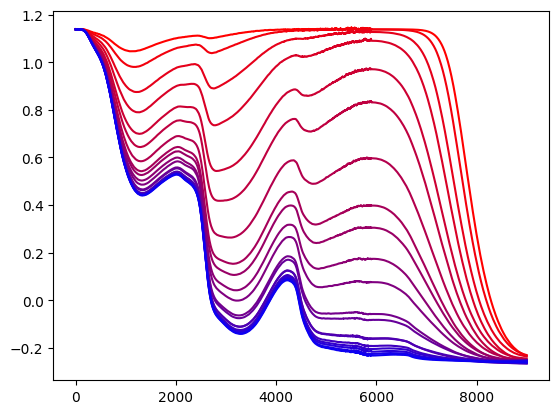

In [16]:
all_samples = []

##########################
#
#           THIS CELL LOADS THE FIRST DATA SET, which is CuSO4 mixed with water in different concentrations
#
##########################
filename = "newData\cuso4\sample1.csv"
df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[0], header=None)
axis_1 = df[0].values



# Loop through file numbers 1 to 20
for i in range(1, 21):
    filename = f"newData\cuso4\sample{i}.csv"
    
    if i in [11, 12]:
        # --- SPECIAL CASE: sample11 and sample12 ---
        # skiprows=1 removes just the first row.
        # We do not use nrows here because there is no trailing description.
        df = pd.read_csv(filename, skiprows=1, usecols=[1], header=None)
        
        # .values extracts the numpy array.
        # [::-1] reverses the array so the data is in the correct order.
        data = df[1].values[::-1]
        
    else:
        # --- STANDARD CASE: All other samples ---
        # skiprows=19 removes the top 19 rows.
        # nrows=11001 reads exactly 11001 rows of data. 
        # (Row 11020 total - 19 skipped rows = 11001 valid data rows).
        df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[1], header=None)
        
        data = df[1].values

    # Append the processed 1D array to our list
    all_samples.append(data)

# Combine the list of arrays into a single 2D NumPy matrix.
# Note: For np.column_stack to work, all 20 arrays MUST be the exact same length.
try:
    data_matrix =-np.log(np.column_stack(all_samples)/130-np.min(np.column_stack(all_samples))+0.0000)
    print(f"Successfully created a matrix with shape: {data_matrix.shape}")
except ValueError as e:
    print("Error stacking arrays. Checking lengths of each sample to help debug:")
    for idx, arr in enumerate(all_samples):
        print(f"sample{idx+1}.csv length: {len(arr)}")



for i in range(20):
    plt.plot(range(len(data_matrix.T[0,:9000])),data_matrix.T[i,:9000],color=(1-0.05*i,0,0.05*i))

c11=[]
for i in range(20):
    c11.append((1-C_real_2[i]/417.6874,0,C_real_2[i]/417.6874))


In [78]:
all_samples2 = []
##########################
#
#           THIS CELL LOADS THE SECOND  DATA SET, which is Fe Cl3 mixed with water in different concentrations
#
##########################

filename = "newData\\fecl3\sample1.csv"
df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[0], header=None)
axis_2 = df[0].values

# Loop through file numbers 1 to 20
for i in range(0, 8):
    if i%2==0:
        j=int(i/2+1)
        filename = f"newData\\fecl3\sample{j}.csv"
    elif i==7:
        filename = f"newData\\fecl3\sample5a.csv"
    else:
        j= int((i-1)/2)+1
        filename = f"newData\\fecl3\sample{j}a.csv"

        # --- STANDARD CASE: All other samples ---
        # skiprows=19 removes the top 19 rows.
        # nrows=11001 reads exactly 11001 rows of data. 
        # (Row 11020 total - 19 skipped rows = 11001 valid data rows).
    df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[1], header=None)
        
    data = df[1].values

    # Append the processed 1D array to our list
    all_samples2.append(data)

# Combine the list of arrays into a single 2D NumPy matrix.
# Note: For np.column_stack to work, all 20 arrays MUST be the exact same length.
try:
    data_matrix2 = -np.log(np.column_stack(all_samples2)/130-np.min(np.column_stack(all_samples2)/130)+0.00001)
    print(f"Successfully created a matrix with shape: {data_matrix2.shape}")
except ValueError as e:
    print("Error stacking arrays. Checking lengths of each sample to help debug:")
    for idx, arr in enumerate(all_samples2):
        print(f"sample{idx+1}.csv length: {len(arr)}")



c12=[]
for i in range(8):
    c12.append((1-C_real_1[i]/np.max(C_real_1),0,C_real_1[i]/np.max(C_real_1)))

<>:8: SyntaxWarning: invalid escape sequence '\s'
<>:16: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:8: SyntaxWarning: invalid escape sequence '\s'
<>:16: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\906231123.py:8: SyntaxWarning: invalid escape sequence '\s'
  filename = "newData\\fecl3\sample1.csv"
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\906231123.py:16: SyntaxWarning: invalid escape sequence '\s'
  filename = f"newData\\fecl3\sample{j}.csv"
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\906231123.py:18: SyntaxWarning: invalid escape sequence '\s'
  filename = f"newData\\fecl3\sample5a.csv"
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\906231123.py:21: SyntaxWarning: invalid escape sequence '\s'
  filename = f"newDa

Successfully created a matrix with shape: (11001, 8)


In [79]:
all_samples3 = []
##########################
#
#           THIS CELL LOADS THE THIRD  DATA SET, which is Fe SO4 mixed with water in different concentrations
#
##########################

filename = "newData\\feso4\sample1.csv"
df = pd.read_csv(filename, skiprows=19, nrows=11001, usecols=[0], header=None)
axis_3 = df[0].values

# Loop through file numbers 1 to 20
for i in range(1, 8):
    filename = f"newData\\feso4\sample{i}.csv"
    
    # Read the CSV file
    # skiprows=19 ignores the first 19 rows
    # usecols=[1] selects only the second column (0-indexed)
    # header=None ensures the first line of real data isn't swallowed as a header label
    df = pd.read_csv(filename, skiprows=19,nrows=11001, usecols=[1], header=None)
    
    # Convert the pandas column to a 1D NumPy array and append it
    # Because we used usecols=[1] and header=None, the column name defaults to 1
    all_samples3.append(df[1].values)

# Combine the list of arrays into a single 2D NumPy matrix.
# np.column_stack places each sample side-by-side (each sample is a column).
data_matrix3 = -np.log(np.column_stack(all_samples3)/130-np.min(np.column_stack(all_samples3))+0.0001)

# --- Optional: If you prefer each sample to be a row instead of a column ---
# data_matrix = np.vstack(all_samples)

c13=[]
for i in range(7):
    c13.append((1-C_real_3[i]/np.max(C_real_3),0,C_real_3[i]/np.max(C_real_3)))

<>:8: SyntaxWarning: invalid escape sequence '\s'
<>:14: SyntaxWarning: invalid escape sequence '\s'
<>:8: SyntaxWarning: invalid escape sequence '\s'
<>:14: SyntaxWarning: invalid escape sequence '\s'
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\2054684572.py:8: SyntaxWarning: invalid escape sequence '\s'
  filename = "newData\\feso4\sample1.csv"
C:\Users\mtyle\AppData\Local\Temp\ipykernel_34692\2054684572.py:14: SyntaxWarning: invalid escape sequence '\s'
  filename = f"newData\\feso4\sample{i}.csv"


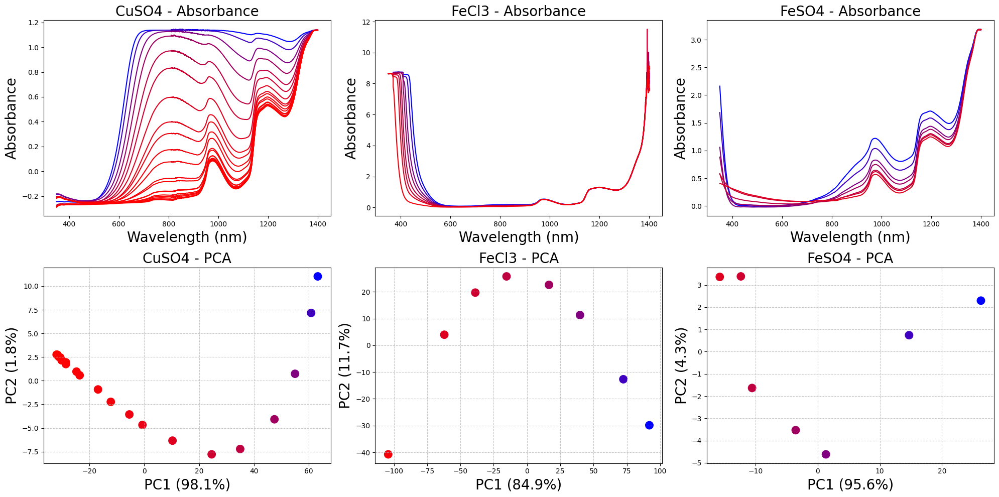

In [113]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

cutoff = 501
fs=20
size=125
# Create a 3-row, 2-column figure layout
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))

# ========================================================
# ROW 1: CuSO4 (data_matrix)
# ========================================================

# 1A: Log Absorption
for i in range(20):
    axs[0, 0].plot(axis_1[:-cutoff], data_matrix.T[i, :-cutoff], color=c11[i])
axs[0, 0].set_title("CuSO4 - Absorbance", fontsize=fs)
axs[0, 0].set_xlabel("Wavelength (nm)", fontsize=fs)
axs[0, 0].set_ylabel("Absorbance", fontsize=fs)

# 1B: PCA
pca1 = PCA(n_components=2)
X_pca1 = pca1.fit_transform(data_matrix.T[:, :-cutoff])
axs[1, 0].scatter(X_pca1[:, 0], X_pca1[:, 1], c=c11, s=size)
#for i in range(20):
#    axs[0, 1].annotate(f"S{i+1}", (X_pca1[i, 0], X_pca1[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axs[1, 0].set_title("CuSO4 - PCA", fontsize=fs)
axs[1, 0].set_xlabel(f"PC1 ({pca1.explained_variance_ratio_[0]*100:.1f}%)", fontsize=fs)
axs[1, 0].set_ylabel(f"PC2 ({pca1.explained_variance_ratio_[1]*100:.1f}%)", fontsize=fs)
axs[1, 0].grid(True, linestyle='--', alpha=0.7)


# ========================================================
# ROW 2: FeCl3 (data_matrix2)
# ========================================================

# 2A: Log Absorption
for i in range(8):
    axs[0, 1].plot(axis_2[:-cutoff], data_matrix2.T[i,:-cutoff], color=c12[i])
axs[0, 1].set_title("FeCl3 - Absorbance", fontsize=fs)
axs[0, 1].set_xlabel("Wavelength (nm)", fontsize=fs)
axs[0, 1].set_ylabel("Absorbance", fontsize=fs)

# 2B: PCA
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(data_matrix2.T[:,:-cutoff])
axs[1, 1].scatter(X_pca2[:, 0], X_pca2[:, 1], c=c12, s=size)
# (Annotations omitted for FeCl3 since they weren't in your original loop, but you can add them if needed)
axs[1, 1].set_title("FeCl3 - PCA", fontsize=fs)
axs[1, 1].set_xlabel(f"PC1 ({pca2.explained_variance_ratio_[0]*100:.1f}%)", fontsize=fs)
axs[1, 1].set_ylabel(f"PC2 ({pca2.explained_variance_ratio_[1]*100:.1f}%)", fontsize=fs)
axs[1, 1].grid(True, linestyle='--', alpha=0.7)


# ========================================================
# ROW 3: FeSO4 (data_matrix3)
# ========================================================

# 3A: Log Absorption
for i in range(7):
    axs[0, 2].plot(axis_3[:-cutoff], data_matrix3.T[i,:-cutoff], color=c13[i])
axs[0, 2].set_title("FeSO4 - Absorbance", fontsize=fs)
axs[0, 2].set_xlabel("Wavelength (nm)", fontsize=fs)
axs[0, 2].set_ylabel("Absorbance", fontsize=fs)

# 3B: PCA 
pca3 = PCA(n_components=2)
X_pca3 = pca3.fit_transform(data_matrix3.T[:,:-cutoff])
axs[1, 2].scatter(X_pca3[:, 0], X_pca3[:, 1], c=c13, s=size)
#for i in range(7):
#    axs[2, 1].annotate(f"S{i+1}", (X_pca3[i, 0], X_pca3[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axs[1, 2].set_title("FeSO4 - PCA", fontsize=fs)
axs[1, 2].set_xlabel(f"PC1 ({pca3.explained_variance_ratio_[0]*100:.1f}%)", fontsize=fs)
axs[1, 2].set_ylabel(f"PC2 ({pca3.explained_variance_ratio_[1]*100:.1f}%)", fontsize=fs)
axs[1, 2].grid(True, linestyle='--', alpha=0.7)


# Final layout adjustments to prevent labels from overlapping
plt.tight_layout()
plt.show()

Text(0, 0.5, 'Concentration (mM)')

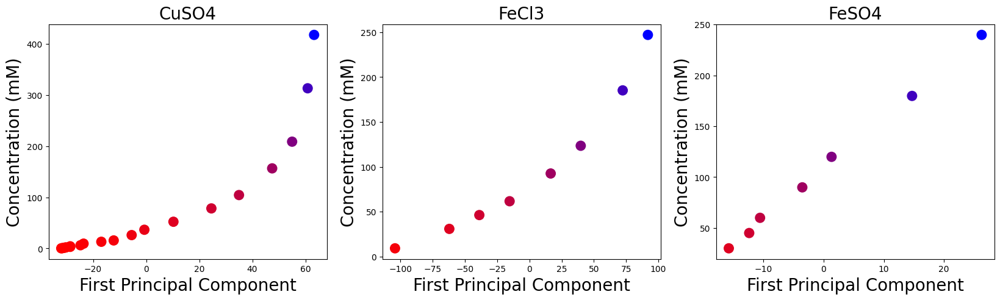

In [115]:
#fig1, axs1 = plt.subplots(nrows=1, ncols=1, figsize=(10 ,10))
#print(X_pca1[:, 0])

#axs1.scatter(X_pca3[:, 0], np.array(C_real_3))
#axs1.scatter(X_pca1[:, 0], np.array(C_real_2))
#X=np.linspace(0,5)
#axs1.plot(X,6/4*X)

fs=20
size = 125

figr, axsr = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axsr[0].scatter(X_pca1[:, 0], np.array(C_real_2),c=c11,s=size)
axsr[1].scatter(X_pca2[:, 0], np.array(C_real_1),c=c12,s=size)
axsr[2].scatter(X_pca3[:, 0], np.array(C_real_3),c=c13,s=size)


axsr[0].set_title("CuSO4", fontsize=fs)
axsr[1].set_title("FeCl3", fontsize=fs)
axsr[2].set_title("FeSO4", fontsize=fs)


axsr[0].set_xlabel("First Principal Component", fontsize=fs)
axsr[0].set_ylabel("Concentration (mM)", fontsize=fs)
axsr[1].set_xlabel("First Principal Component", fontsize=fs)
axsr[1].set_ylabel("Concentration (mM)" ,fontsize=fs)
axsr[2].set_xlabel("First Principal Component", fontsize=fs)
axsr[2].set_ylabel("Concentration (mM)", fontsize=fs)


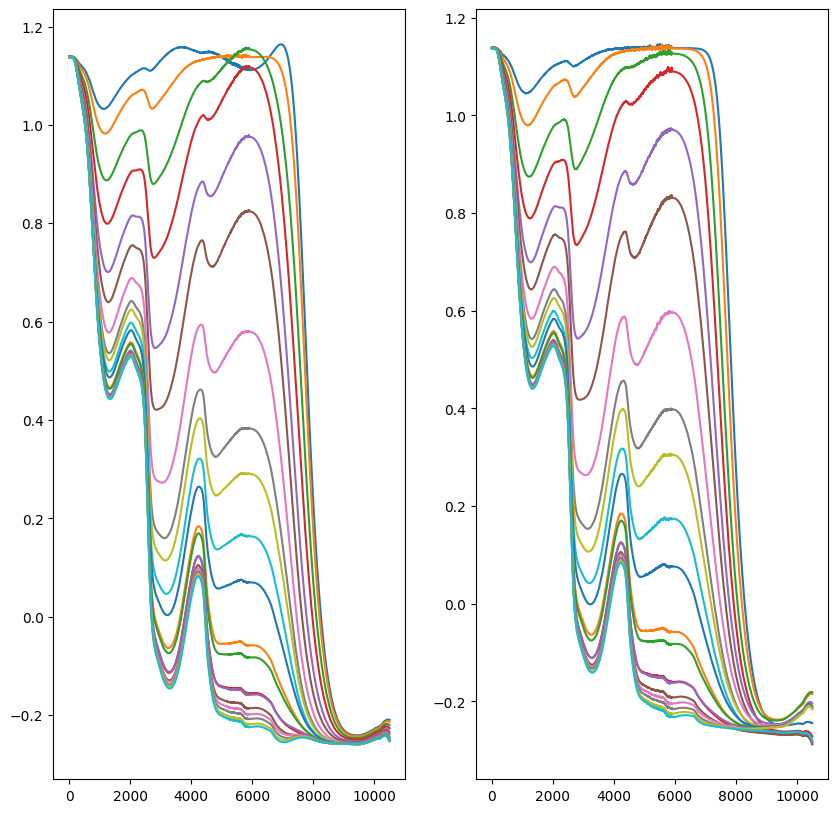

In [116]:
fig2, axs2 = plt.subplots(nrows=1, ncols=2, figsize=(10 ,10))
principal_vectors = pca1.components_
X_pca1[:, 0]
baseline = X_pca1[19, 0]*principal_vectors[0]+X_pca1[19, 1]*principal_vectors[1]-data_matrix.T[19, :-cutoff]
for i in range(19):
    baseline+= X_pca1[i, 0]*principal_vectors[0]+X_pca1[i, 1]*principal_vectors[1]-data_matrix.T[i, :-cutoff]

baseline=baseline/20


for i in range(20):
        axs2[0].plot(range(len(data_matrix.T[0, :-cutoff])), X_pca1[i, 0]*principal_vectors[0]+X_pca1[i, 1]*principal_vectors[1]-baseline)
        axs2[1].plot(range(len(data_matrix.T[0, :-cutoff])), data_matrix.T[i, :-cutoff])







#axs2.plot(range(len(data_matrix.T[0, :10000])), 63*principal_vectors[0])
#axs2.plot(range(len(data_matrix.T[0, :10000])), data_matrix.T[0, :10000])

#axs2.plot(range(len(data_matrix.T[0, :10000])), -33*principal_vectors[0])
#axs2.plot(range(len(data_matrix.T[0, :10000])), data_matrix.T[-1, :10000])


#axs2.plot(range(len(data_matrix.T[0, :10000])), principal_vectors[1])

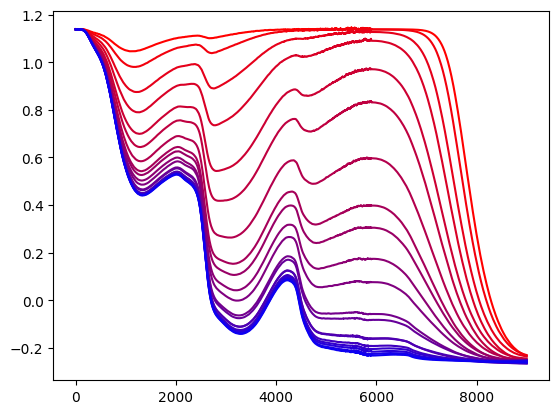

In [117]:

for i in range(20):
    plt.plot(range(len(data_matrix.T[0,:9000])),data_matrix.T[i,:9000],color=(1-0.05*i,0,0.05*i))

plt.show()

#c11=[]
#for i in range(20):
#    c11.append((1-0.05*i,0,0.05*i))

In [118]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

def generate_synthetic_data(data_matrix_a, C_real_2_a, num_new_points, error_std, kind='quadratic',sd=42):
    """
    Generates new labeled data points via interpolation with a controllable error term.
    
    Parameters:
    -----------
    data_matrix : numpy.ndarray
        Shape (11001, 20). The original feature matrix.
    C_real_2    : numpy.ndarray
        Shape (1, 20) or (20,). The concentration labels.
    num_new_points : int
        The number of new synthetic points to generate.
    error_std   : float
        The standard deviation of the Gaussian noise (controllable error term).
    kind        : str
        The type of interpolation ('linear', 'quadratic', 'cubic'). 
        'cubic' is recommended for smooth physical parameter families.
        
    Returns:
    --------
    synthetic_matrix : numpy.ndarray
        Shape (11001, num_new_points). The new interpolated and noisy features.
    new_labels : numpy.ndarray
        Shape (1, num_new_points). The corresponding concentration labels.
    """

    np.random.seed(seed=sd)
    
    # 1. Ensure labels are a 1D array for scipy
    labels_1d = np.squeeze(C_real_2_a)
    
    # 2. Sort the data based on the concentrations
    # Interpolation requires strictly increasing independent variables
    sort_indices = np.argsort(labels_1d)
    sorted_labels = labels_1d[sort_indices]
    sorted_matrix = data_matrix_a[:, sort_indices]
    
    # 3. Create the interpolation function
    # axis=1 ensures we interpolate across the 20 columns for all 11001 rows
    interpolator = interp1d(sorted_labels, sorted_matrix, kind=kind, axis=1)
    
    # 4. Generate new concentration labels 
    # (Uniformly sampled within the min and max of your real concentrations)
    min_c, max_c = sorted_labels[0], sorted_labels[-1]
    new_labels_1d = []
    while (len(new_labels_1d)<num_new_points):
        #new_labels_1d = np.random.exponential(scale=sum(C_real_2_a)/len(C_real_2_a),size=num_new_points)
        new_labels_1d = np.random.uniform(min_c,max_c,size=num_new_points)
        new_labels_1d = new_labels_1d[( new_labels_1d>= min_c) & (new_labels_1d <= max_c)]
    
    
    #new_labels_1d = np.random.uniform(low=min_c, high=max_c, size=num_new_points)



    # 5. Interpolate the base synthetic data matrix
    base_synthetic_matrix = interpolator(new_labels_1d)
    
    # 6. Generate the controllable error term (Gaussian noise)
    noise = np.random.normal(loc=0.0, scale=error_std, size=base_synthetic_matrix.shape)
    
    # 7. Add noise to create the final synthetic data
    synthetic_matrix = base_synthetic_matrix + noise
    
    # Format labels back to (1, num_new_points) to match original structure
    new_labels = new_labels_1d.reshape(1, -1)
    
    return synthetic_matrix, new_labels

# --- Example Usage ---
# Assuming data_matrix and C_real_2 are already defined in your environment:
# data_matrix = np.random.rand(11001, 20)
# C_real_2 = np.linspace(0.1, 5.0, 20).reshape(1, 20)

# Generate 500 new samples with a noise standard deviation of 0.05
# synthetic_X, synthetic_C = generate_synthetic_data(
#     data_matrix, 
#     C_real_2, 
#     num_new_points=500, 
#     error_std=0.05
# )






In [119]:
amt = 200
er = 0.001

synth_X_2, synth_C_2 = generate_synthetic_data(data_matrix2[:-cutoff,:], C_real_1, num_new_points=amt, error_std=er)
synth_X_3, synth_C_3 = generate_synthetic_data(data_matrix3[:-cutoff,:], C_real_3, num_new_points=amt, error_std=er)
synth_X, synth_C = generate_synthetic_data(data_matrix[:-cutoff,:], C_real_2, num_new_points=amt, error_std=er)


In [120]:


synth_cols = synth_C/np.max(synth_C)
synth_cols2 = synth_C_2/np.max(synth_C_2)
synth_cols3 = synth_C_3/np.max(synth_C_3)
print(synth_cols[0,3])
print(synth_X.shape)
print(data_matrix.shape)
print(np.max(synth_C[0]))

print(np.min(synth_C[0]))


0.6068621711303658
(10500, 200)
(11001, 20)
412.21366186848326
2.5661317946380566


In [121]:



points = amt


#synth_X, synth_C = generate_synthetic_data(data_matrix[:-cutoff,:], C_real_2, num_new_points=points, error_std=0.05)

A_1 = (synth_C+1e-10)/(np.max(synth_C)+1e-9)
A_2 = 1-A_1

A_1_2 = (synth_C_2+1e-10)/(np.max(synth_C_2)+1e-9)
A_2_2 = 1-A_1_2
A_1_3 = (synth_C_3+1e-10)/(np.max(synth_C_3)+1e-9)
A_2_3 = 1-A_1_3

A = np.array([A_1,A_2])
A2 = np.array([A_1_2,A_2_2])
A3 = np.array([A_1_3,A_2_3])


print(A.shape)
A= A.reshape(2,points)
A2= A2.reshape(2,points)
A3= A3.reshape(2,points)

S_T =np.array( [data_matrix[:-cutoff,0],data_matrix[:-cutoff,-1]])
S_T_2 =np.array( [data_matrix2[:-cutoff,0],data_matrix2[:-cutoff,-1]])
S_T_3 =np.array( [data_matrix3[:-cutoff,0],data_matrix3[:-cutoff,-1]])

S=S_T.T

S2=S_T_2.T
S3=S_T_3.T



print(synth_X[::10,:].shape)
print(A.shape)
print(S[::10,:].shape)



custom_dataset = {
    'X': synth_X[::10,:],
    'A_gt': A,
    'S_gt': S[::10,:]
}
np.save('synth_CuSO4_data.npy', custom_dataset)
custom_dataset2 = {
    'X': synth_X_2[::10,:],
    'A_gt': A2,
    'S_gt': S2[::10,:]
}
np.save('synth_FeCl3_data.npy', custom_dataset2)
custom_dataset3 = {
    'X': synth_X_3[::10,:],
    'A_gt': A3,
    'S_gt': S3[::10,:]
}
np.save('synth_FeSO4_data.npy', custom_dataset3)

(2, 1, 200)
(1050, 200)
(2, 200)
(1050, 2)


In [122]:
#plt.plot(range(len(synth_X)),synth_X)

In [123]:
combined_data = np.hstack((data_matrix[:-cutoff,:],synth_X))
combined_data2 = np.hstack((data_matrix2[:-cutoff,:],synth_X_2))
combined_data3 = np.hstack((data_matrix3[:-cutoff,:],synth_X_3))

print(combined_data.shape)
print(data_matrix[0].size)

(10500, 220)
20


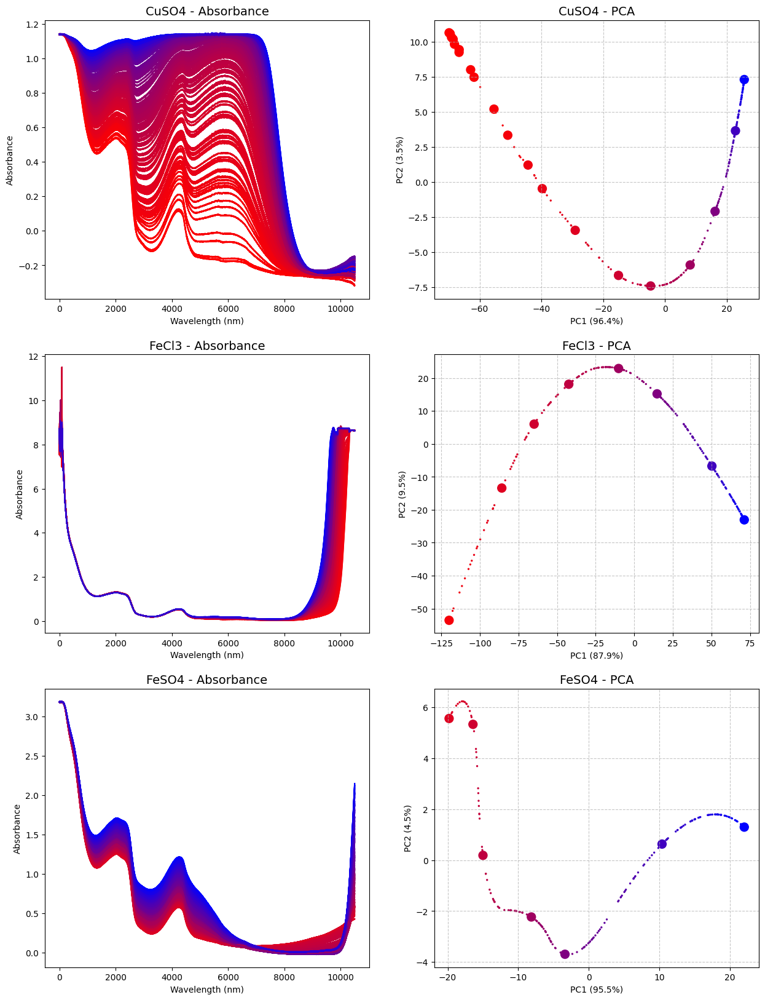

In [124]:
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 20))
s1 = int(2)
s2 = int(100)
# ========================================================
# ROW 1: CuSO4 (data_matrix)
# ========================================================

# 1A: Log Absorption
syn_c=[]
for i in range(len(synth_C[0])):
    syn_c.append((1-synth_cols[0,i], 0, synth_cols[0,i]))
    axs[0, 0].plot(range(len(synth_X.T[0])), synth_X.T[i], color=syn_c[i])
    

combined_cols = np.concat((c11,syn_c),axis=0)

sizes = np.full(data_matrix[0].size+synth_X[0].size,s1)
sizes[:data_matrix[0].size] = s2
#print(sizes)

axs[0, 0].set_title("CuSO4 - Absorbance", fontsize=14)
axs[0, 0].set_xlabel("Wavelength (nm)")
axs[0, 0].set_ylabel("Absorbance")

# 1B: PCA
pca1 = PCA(n_components=2)
X_pca1 = pca1.fit_transform(combined_data.T)

axs[0, 1].scatter(X_pca1[:, 0], X_pca1[:, 1], c=combined_cols, s=sizes)
#for i in range(20):
#    axs[0, 1].annotate(f"S{i+1}", (X_pca1[i, 0], X_pca1[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axs[0, 1].set_title("CuSO4 - PCA", fontsize=14)
axs[0, 1].set_xlabel(f"PC1 ({pca1.explained_variance_ratio_[0]*100:.1f}%)")
axs[0, 1].set_ylabel(f"PC2 ({pca1.explained_variance_ratio_[1]*100:.1f}%)")
axs[0, 1].grid(True, linestyle='--', alpha=0.7)










syn_c2=[]
for i in range(len(synth_C_2[0])):
    syn_c2.append((1-synth_cols2[0,i], 0, synth_cols2[0,i]))
    axs[1, 0].plot(range(len(synth_X_2.T[0])), synth_X_2.T[i], color=syn_c2[i])
    

combined_cols_2 = np.concat((c12,syn_c2),axis=0)


sizes2 = np.full(data_matrix2[0].size+synth_X_2[0].size,s1)
sizes2[:data_matrix2[0].size] = s2
#print(sizes)

axs[1, 0].set_title("FeCl3 - Absorbance", fontsize=14)
axs[1, 0].set_xlabel("Wavelength (nm)")
axs[1, 0].set_ylabel("Absorbance")

# 1B: PCA
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(combined_data2.T)

axs[1, 1].scatter(X_pca2[:, 0], X_pca2[:, 1], c=combined_cols_2, s=sizes2)
#for i in range(20):
#    axs[0, 1].annotate(f"S{i+1}", (X_pca1[i, 0], X_pca1[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axs[1, 1].set_title("FeCl3 - PCA", fontsize=14)
axs[1, 1].set_xlabel(f"PC1 ({pca2.explained_variance_ratio_[0]*100:.1f}%)")
axs[1, 1].set_ylabel(f"PC2 ({pca2.explained_variance_ratio_[1]*100:.1f}%)")
axs[1, 1].grid(True, linestyle='--', alpha=0.7)









syn_c3=[]
for i in range(len(synth_C_3[0])):
    syn_c3.append((1-synth_cols3[0,i], 0, synth_cols3[0,i]))
    axs[2, 0].plot(range(len(synth_X_3.T[0])), synth_X_3.T[i], color=syn_c3[i])
    

combined_cols_3 = np.concat((c13,syn_c3),axis=0)


sizes3 = np.full(data_matrix3[0].size+synth_X_3[0].size,s1)
sizes3[:data_matrix3[0].size] = s2
#print(sizes)

axs[2, 0].set_title("FeSO4 - Absorbance", fontsize=14)
axs[2, 0].set_xlabel("Wavelength (nm)")
axs[2, 0].set_ylabel("Absorbance")

# 1B: PCA
pca3 = PCA(n_components=2)
X_pca3 = pca3.fit_transform(combined_data3.T)

axs[2, 1].scatter(X_pca3[:, 0], X_pca3[:, 1], c=combined_cols_3, s=sizes3)
#for i in range(20):
#    axs[0, 1].annotate(f"S{i+1}", (X_pca1[i, 0], X_pca1[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axs[2, 1].set_title("FeSO4 - PCA", fontsize=14)
axs[2, 1].set_xlabel(f"PC1 ({pca3.explained_variance_ratio_[0]*100:.1f}%)")
axs[2, 1].set_ylabel(f"PC2 ({pca3.explained_variance_ratio_[1]*100:.1f}%)")
axs[2, 1].grid(True, linestyle='--', alpha=0.7)


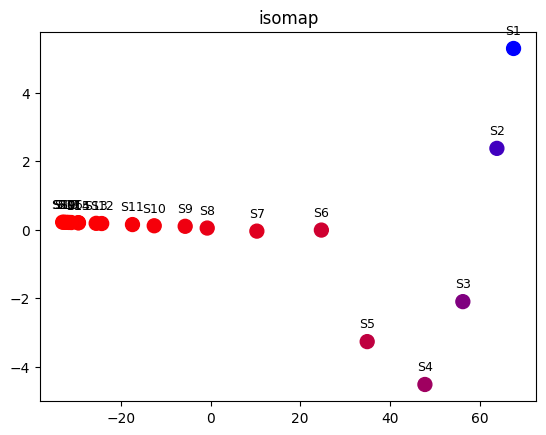

In [125]:
from sklearn.manifold import Isomap
X = data_matrix.T[:,:9000] 
embedding = Isomap(n_components=2)
X_transformed = embedding.fit_transform(X)
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('isomap')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)


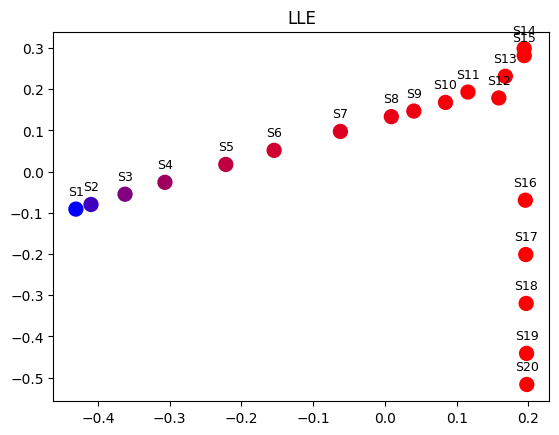

In [126]:
from sklearn.manifold import locally_linear_embedding
X = data_matrix.T[:,:9000] 
embedding, _ = locally_linear_embedding(X,n_neighbors=5, n_components=2)
X_transformed = embedding
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('LLE')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

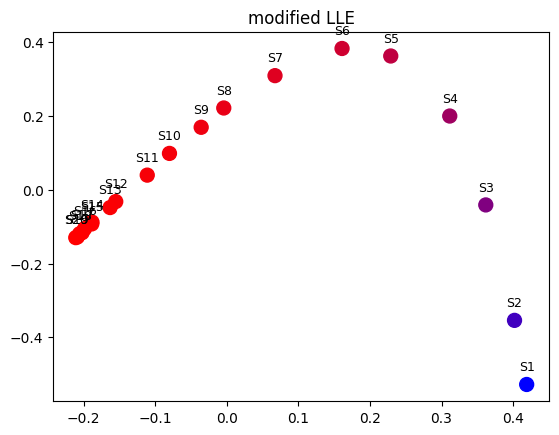

In [127]:
from sklearn.manifold import locally_linear_embedding
X = data_matrix.T[:,:9000] 
embedding, _ = locally_linear_embedding(X,n_neighbors=5, n_components=2, method= 'modified')
X_transformed = embedding
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('modified LLE')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

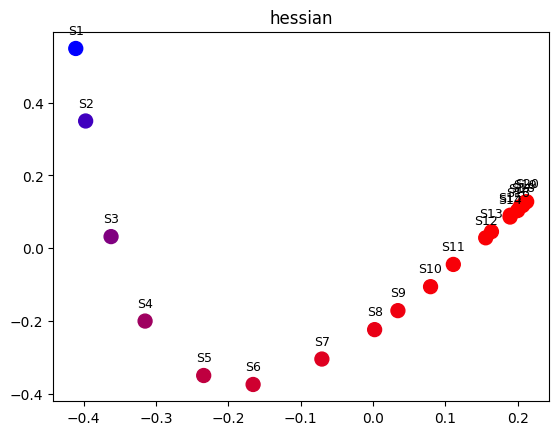

In [128]:
from sklearn.manifold import locally_linear_embedding
X = data_matrix.T[:,:9000] 
embedding, _ = locally_linear_embedding(X,n_neighbors=10, n_components=2, method = 'hessian')
X_transformed = embedding
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('hessian')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

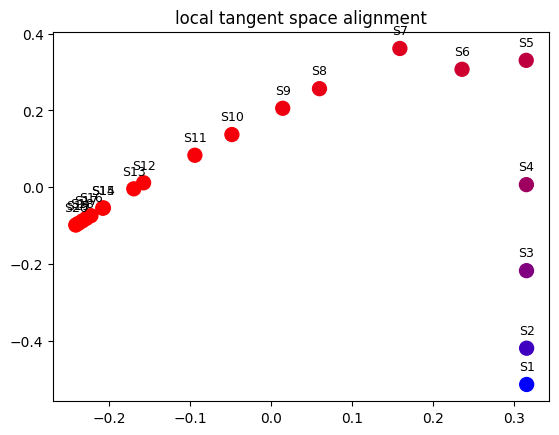

In [129]:
from sklearn.manifold import locally_linear_embedding
X = data_matrix.T[:,:9000] 
embedding, _ = locally_linear_embedding(X,n_neighbors=4, n_components=2, method = 'ltsa')
X_transformed = embedding
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('local tangent space alignment')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

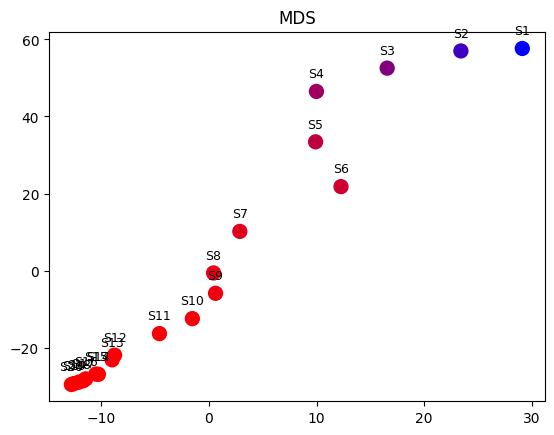

In [130]:
from sklearn.manifold import MDS
X = data_matrix.T[:,:9000] 
cmds  = MDS(n_components=2, n_init=1)
X_transformed = cmds.fit_transform(X)
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('MDS')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

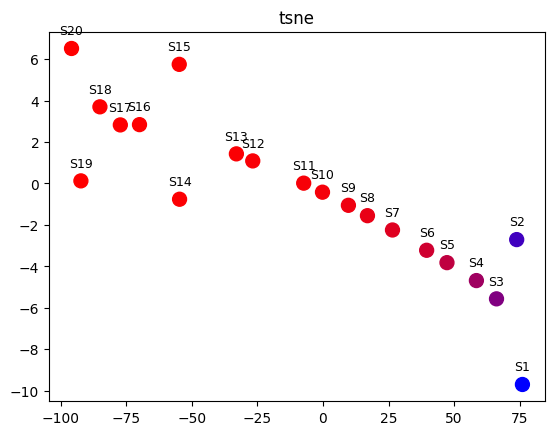

In [131]:
from sklearn.manifold import TSNE
X = data_matrix.T[:,:9000] 
#cmds  = MDS(n_components=2, n_init=1)
X_transformed  = TSNE(n_components=2, learning_rate='auto',
                  init='random', perplexity=3).fit_transform(X)


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('tsne')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

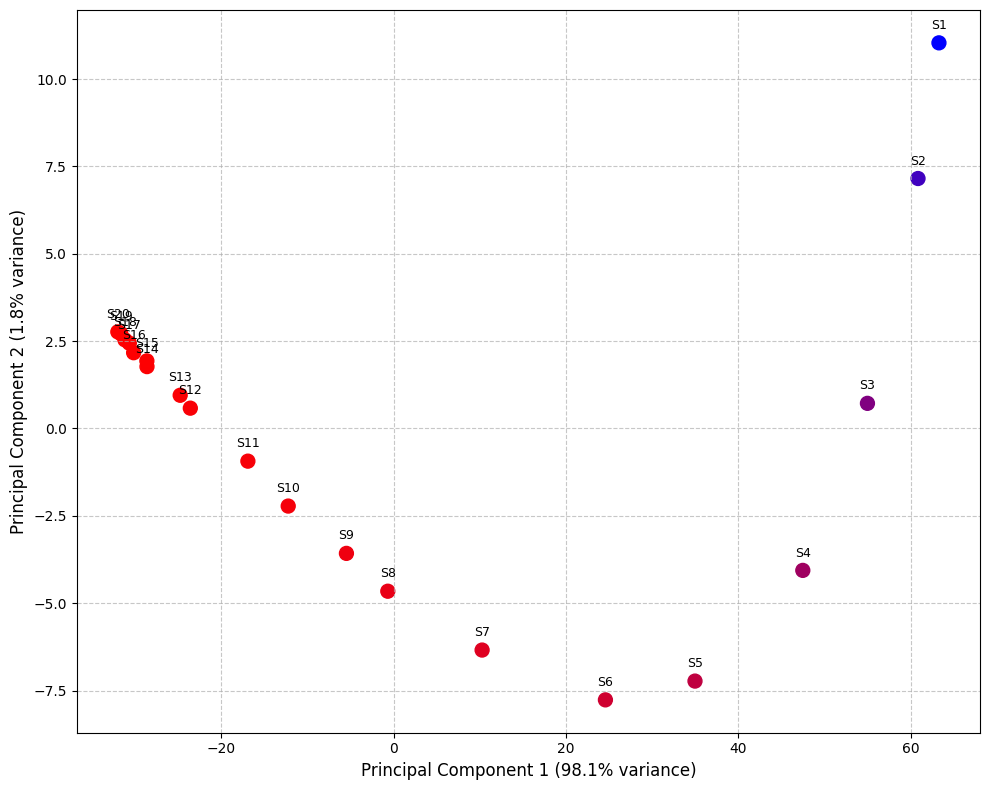

In [132]:
# 1. Transpose the Data
# Machine learning libraries expect a design matrix of shape (n_samples, n_features).
# Our data_matrix is currently (11001, 20), so we must transpose it to (20, 11001).
X = data_matrix.T[:,:9000] 

# 2. Perform PCA
# We specify 2 components to project the 11,001-dimensional space down to a 2D plane.
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# 3. Plot the Results
plt.figure(figsize=(10, 8))

# Scatter plot of the two principal components
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=c11, s=100)

# Annotate each point so you can identify the samples
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_pca[i, 0], X_pca[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

# Format the plot
#plt.title("PCA of 20 Samples (2D Projection)", fontsize=14)

# It is good practice to show how much variance each principal component explains
var_1 = pca.explained_variance_ratio_[0] * 100
var_2 = pca.explained_variance_ratio_[1] * 100
plt.xlabel(f"Principal Component 1 ({var_1:.1f}% variance)", fontsize=12)
plt.ylabel(f"Principal Component 2 ({var_2:.1f}% variance)", fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

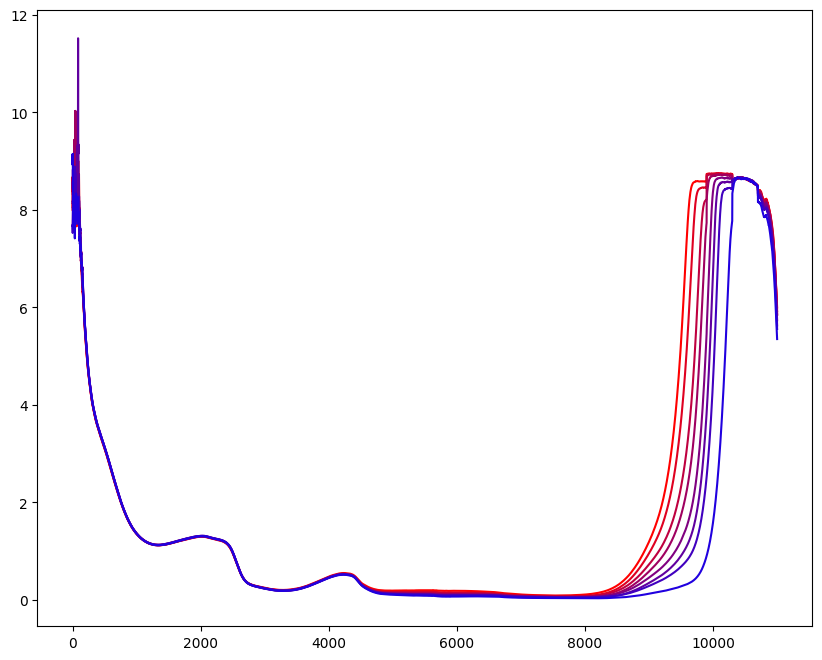

In [133]:
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(range(len(data_matrix2.T[0])),data_matrix2.T[i],color=(1-1/8*i,0,1/8*i))

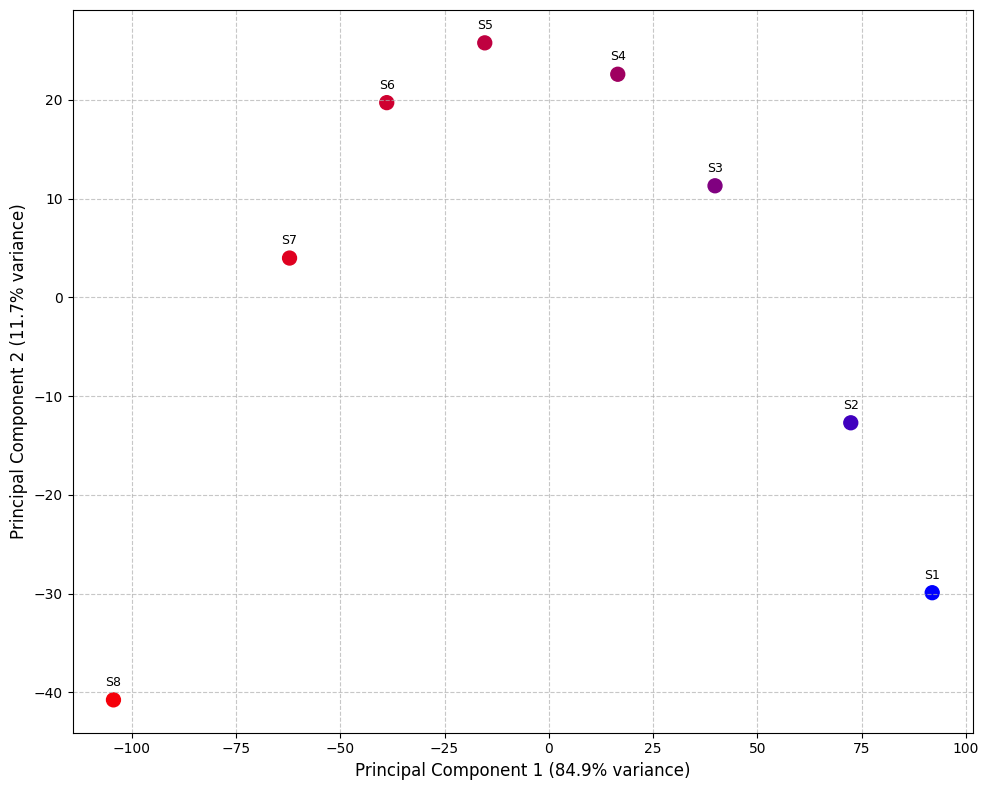

In [134]:
X = data_matrix2.T
 

# 2. Perform PCA
# We specify 2 components to project the 11,001-dimensional space down to a 2D plane.
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# 3. Plot the Results
plt.figure(figsize=(10, 8))

for i in range(8):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_pca[i, 0], X_pca[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)


# Scatter plot of the two principal components
plt.scatter(X_pca[:, 0], X_pca[:, 1],c=c12, s=100)
#plt.title("PCA of 20 Samples (2D Projection)", fontsize=14)

# It is good practice to show how much variance each principal component explains
var_1 = pca.explained_variance_ratio_[0] * 100
var_2 = pca.explained_variance_ratio_[1] * 100
plt.xlabel(f"Principal Component 1 ({var_1:.1f}% variance)", fontsize=12)
plt.ylabel(f"Principal Component 2 ({var_2:.1f}% variance)", fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

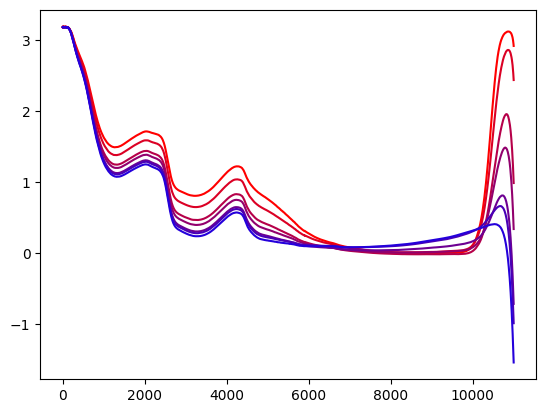

In [135]:
for i in range(7):
    plt.plot(range(len(data_matrix3.T[0])),data_matrix3.T[i],color=(1-1/7*i,0,1/7*i))

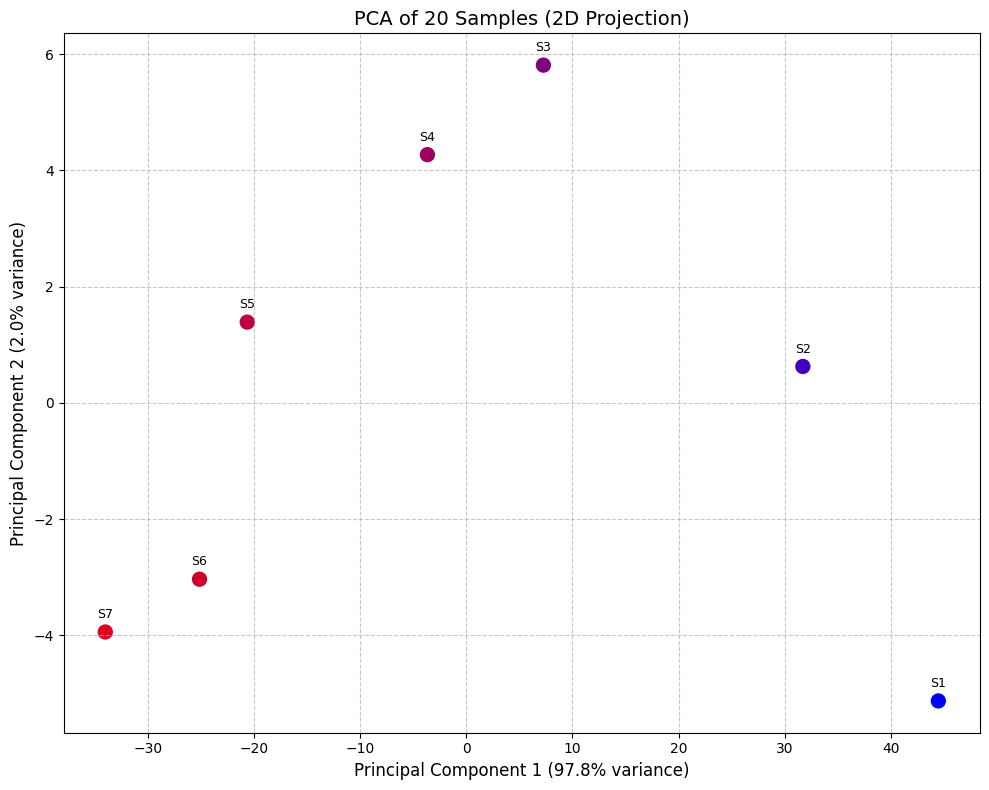

In [136]:
# 1. Transpose the Data
# Machine learning libraries expect a design matrix of shape (n_samples, n_features).
# Our data_matrix is currently (11001, 20), so we must transpose it to (20, 11001).
X = data_matrix3.T 

# 2. Perform PCA
# We specify 2 components to project the 11,001-dimensional space down to a 2D plane.
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# 3. Plot the Results
plt.figure(figsize=(10, 8))

# Scatter plot of the two principal components
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=c13, s=100)

# Annotate each point so you can identify the samples
for i in range(7):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_pca[i, 0], X_pca[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)

# Format the plot
plt.title("PCA of 20 Samples (2D Projection)", fontsize=14)

# It is good practice to show how much variance each principal component explains
var_1 = pca.explained_variance_ratio_[0] * 100
var_2 = pca.explained_variance_ratio_[1] * 100
plt.xlabel(f"Principal Component 1 ({var_1:.1f}% variance)", fontsize=12)
plt.ylabel(f"Principal Component 2 ({var_2:.1f}% variance)", fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

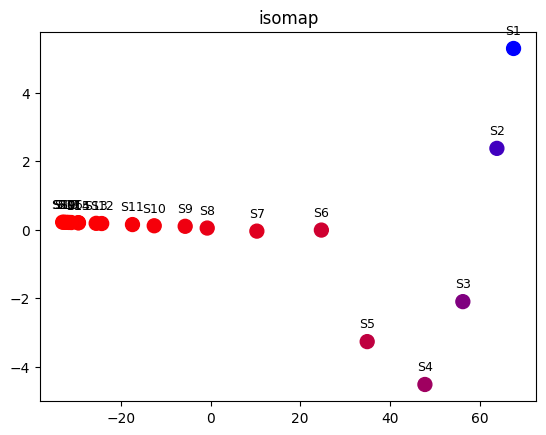

In [137]:
# Calculate the error and st dev:



from sklearn.manifold import Isomap
X = data_matrix.T[:,:9000] 
embedding = Isomap(n_components=2)
X_transformed = embedding.fit_transform(X)
X_transformed.shape


plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=c11, s=100)
plt.title('isomap')
for i in range(20):
    # i+1 ensures our labels match the 1-20 naming convention
    plt.annotate(f"S{i+1}", 
                 (X_transformed[i, 0], X_transformed[i, 1]),
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center',
                 fontsize=9)



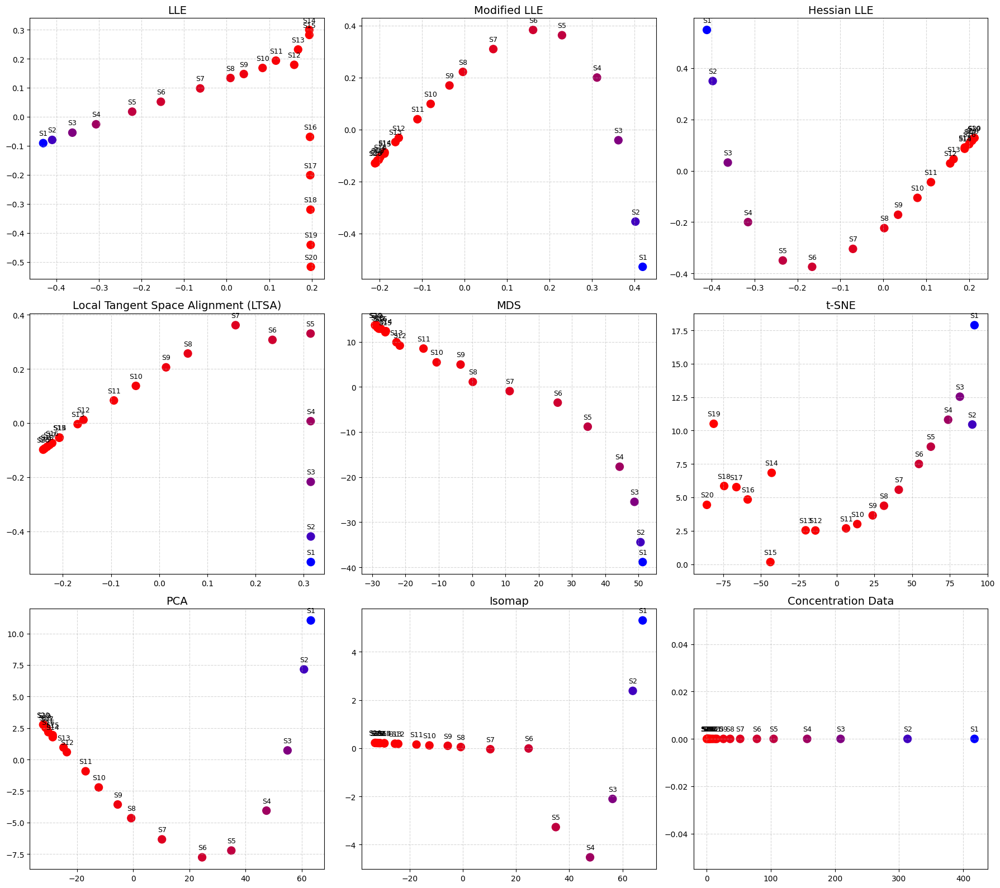

In [138]:
import matplotlib.pyplot as plt
from sklearn.manifold import locally_linear_embedding, MDS, TSNE, Isomap
from sklearn.decomposition import PCA
import random
dim = 2

random.seed(11)
# 1. Define the data
X = data_matrix.T[:, :9000] 


# 2. Setup the 3x3 subplot grid
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
axes = axes.flatten() # Flatten to make indexing easier (0 to 8)

# Helper function to plot and annotate on a specific axis
def plot_embedding(ax, X_transformed, title):
    ax.scatter(X_transformed[:, 0], 
               X_transformed[:, dim-1],#X_transformed[:, 1], 
               c=c11, s=100)
    ax.set_title(title, fontsize=14)
    for i in range(20):
        ax.annotate(f"S{i+1}", 
                     (X_transformed[i, 0],  X_transformed[i, dim-1]),#            X_transformed[i, 1]),
                     textcoords="offset points", 
                     xytext=(0, 10), 
                     ha='center',
                     fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.5)

# --- 1. LLE (Cell 4) ---
embedding_lle, _ = locally_linear_embedding(X, n_neighbors=5, n_components=dim)
plot_embedding(axes[0], embedding_lle, 'LLE')

# --- 2. Modified LLE (Cell 5) ---
embedding_mod_lle, _ = locally_linear_embedding(X, n_neighbors=5, n_components=dim, method='modified')
plot_embedding(axes[1], embedding_mod_lle, 'Modified LLE')

# --- 3. Hessian LLE (Cell 6) ---
embedding_hessian, _ = locally_linear_embedding(X, n_neighbors=10, n_components=dim, method='hessian')
plot_embedding(axes[2], embedding_hessian, 'Hessian LLE')

# --- 4. LTSA (Cell 7) ---
embedding_ltsa, _ = locally_linear_embedding(X, n_neighbors=4, n_components=dim, method='ltsa')
plot_embedding(axes[3], embedding_ltsa, 'Local Tangent Space Alignment (LTSA)')

# --- 5. MDS (Cell 8) ---
cmds = MDS(n_components=dim, n_init=1)
embedding_mds = cmds.fit_transform(X)
plot_embedding(axes[4], embedding_mds, 'MDS')

# --- 6. t-SNE (Cell 9) ---
embedding_tsne = TSNE(n_components=dim, learning_rate='auto', init='random', perplexity=3).fit_transform(X)
plot_embedding(axes[5], embedding_tsne, 't-SNE')



# --- 7. PCA (Cell 10) ---
pca = PCA(n_components=dim)
X_pca = pca.fit_transform(X)
plot_embedding(axes[6], X_pca, 'PCA')


# --- 8. Isomap (Cell 11) ---
embedding = Isomap(n_components=dim)
X_iso = embedding.fit_transform(X)
plot_embedding(axes[7], X_iso, 'Isomap')


# --- 9. real
X_real = np.array([C_real_2,np.zeros(20)]).T

plot_embedding(axes[8],X_real,'Concentration Data')


# Add explained variance labels specifically for PCA
#var_1 = pca.explained_variance_ratio_[0] * 100
#var_2 = pca.explained_variance_ratio_[1] * 100
#axes[6].set_xlabel(f"Principal Component 1 ({var_1:.1f}% variance)")
#axes[6].set_ylabel(f"Principal Component 2 ({var_2:.1f}% variance)")

# --- Hide the remaining two blank subplots ---
#axes[7].axis('off')
#axes[8].axis('off')

# Format the final layout
plt.tight_layout()
plt.show()

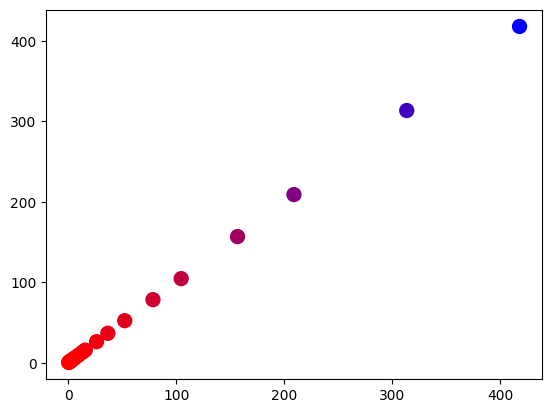

In [139]:
plt.scatter(C_real_2,C_real_2,c=c11, s=100)

In [140]:
print((X_pca-X_pca[0])*(C_real_2[-1]-C_real_2[0])/(X_pca[-1]-X_pca[0])+C_real_2)

ValueError: operands could not be broadcast together with shapes (20,2) (20,) 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA

# --- 1. Define your Known Concentrations ---
# (Replace these with your actual starting and ending concentrations)
C_i = C_real_2[0]  # Known concentration for Sample 1
C_f = C_real_2[-1]  # Known concentration for Sample 20

# Collect all the 2D embeddings from the previous cell's execution
embeddings = {
    'LLE': embedding_lle,
    'Modified LLE': embedding_mod_lle,
    'Hessian LLE': embedding_hessian,
    'LTSA': embedding_ltsa,
    'MDS': embedding_mds,
    't-SNE': embedding_tsne,
    'PCA': X_pca,
    'Isomap': X_iso
}

# Dictionary to store the guessed 1D concentration arrays for each algorithm
guessed_concentrations = {}

for name, emb in embeddings.items():
    # 2. Compute the Line of Best Fit 
    # Using PCA with 1 component finds the line that minimizes orthogonal 
    # projection error (Orthogonal Distance Regression)
    line_fitter = PCA(n_components=1)
    
    # 3. Compute the projection of each point onto this line
    # This transforms the (20, 2) coordinates into a 1D distance along the line
    projections = line_fitter.fit_transform(emb).flatten()
    
    # 4. Compute the Concentration Guess
    # We map the raw 1D projection values onto your [C_i, C_f] concentration scale.
    # We assume Sample 1 (index 0) maps to C_i and Sample 20 (index 19) maps to C_f.
    proj_i = projections[0]
    proj_f = projections[-1]
    
    if proj_f == proj_i:
        # Fallback to prevent divide-by-zero if all points perfectly overlap
        guesses = np.full_like(projections, C_i) 
    else:
        # Linear interpolation formula based on the projections
        guesses = C_i + (projections - proj_i) * (C_f - C_i) / (proj_f - proj_i)
        
    # Store the 1D numpy array of guesses in our dictionary
    guessed_concentrations[name] = guesses

# --- 5. Display the Results ---
# Convert the dictionary of arrays into a clean Pandas DataFrame for easy viewing
df_guesses = pd.DataFrame(guessed_concentrations, index=[f"S{i+1}" for i in range(20)])

print(f"Estimated Sample Concentrations (Calibrated to S1 = {C_i}, S20 = {C_f}):\n")
display(df_guesses)

Estimated Sample Concentrations (Calibrated to S1 = 417.6874, S20 = 0.261054625):



,LLE,Modified LLE,Hessian LLE,LTSA,MDS,t-SNE,PCA,Isomap
S1,417.687400,417.687400,417.687400,417.687400,417.687400,417.687408,417.687400,417.687400
S2,403.696644,407.156508,405.276949,400.545503,-282.913168,437.384644,407.044766,402.274581
S3,372.193374,381.006367,377.217566,366.946097,366.084789,112.801941,381.342204,370.753000
S4,335.246086,347.365870,342.433273,332.185260,-216.572410,68.858307,348.479007,335.627569
S5,278.914094,292.664819,287.665588,282.612929,274.117634,343.543579,293.672696,282.190317
S6,234.170222,247.979332,242.638560,238.786854,229.221276,197.953491,248.131916,239.774475
S7,172.836162,186.276314,181.328904,182.396648,-75.318999,317.047607,185.445757,180.062328
S8,125.679251,138.730466,134.971076,138.651521,123.968660,241.063629,137.506156,134.097718
S9,104.818038,117.621269,114.625796,119.264004,105.094313,294.829803,116.471367,113.705548
S10,75.514201,87.982618,85.988426,92.077292,78.641038,277.909454,86.876821,85.052910


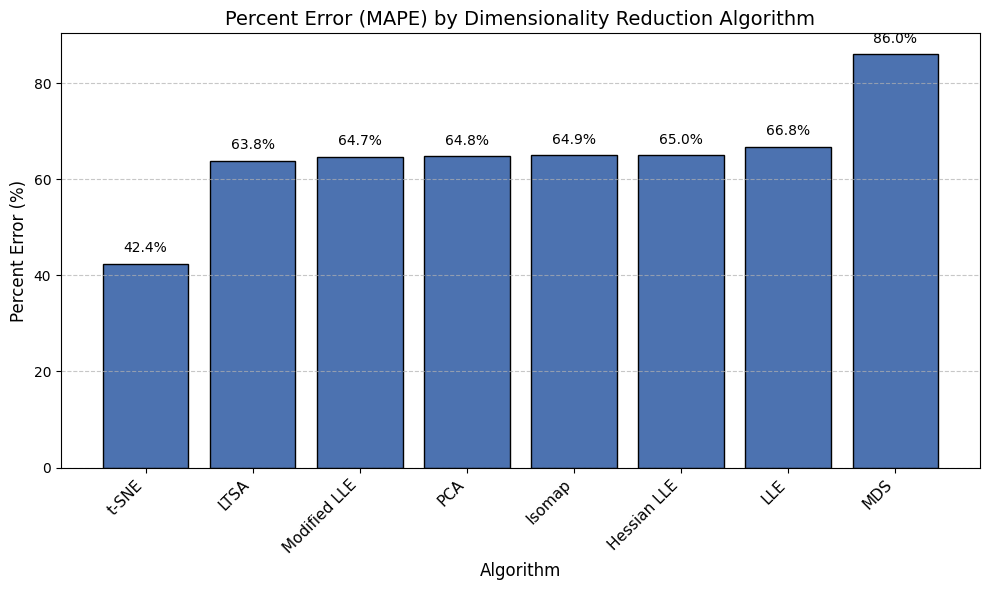

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Define C_real if you haven't already ---
# Example: If it's a linear gradient from C_i to C_f
# C_real = np.linspace(0.0, 1.0, 20) 
# Make sure C_real is defined as a NumPy array of length 20 before running this.
C_real = C_real_2
algorithm_names = []
percent_errors = []

for name, guesses in guessed_concentrations.items():
    # To avoid division by zero, we create a mask for where C_real is NOT zero
    nonzero_mask = C_real != 0
    
    # Calculate Mean Absolute Percentage Error (MAPE) for valid points
    # Formula: Mean( |Guess - Real| / Real ) * 100
    mape = np.mean(np.abs((guesses[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    
    algorithm_names.append(name)
    percent_errors.append(mape)

# --- 2. Sort the data for the bar chart ---
# It is best practice to sort bar charts by value
sorted_indices = np.argsort(percent_errors)
sorted_names = [algorithm_names[i] for i in sorted_indices]
sorted_errors = [percent_errors[i] for i in sorted_indices]

# --- 3. Plot the Bar Chart ---
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_names, sorted_errors, color='#4C72B0', edgecolor='black')

# Format the plot
plt.title('Percent Error (MAPE) by Dimensionality Reduction Algorithm', fontsize=14)
plt.ylabel('Percent Error (%)', fontsize=12)
plt.xlabel('Algorithm', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add the exact percentage values on top of each bar
for bar in bars:
    yval = bar.get_height()
    # Add a slight offset to the y position so the text hovers above the bar
    plt.text(bar.get_x() + bar.get_width()/2, yval + (max(sorted_errors) * 0.02), 
             f"{yval:.1f}%", ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

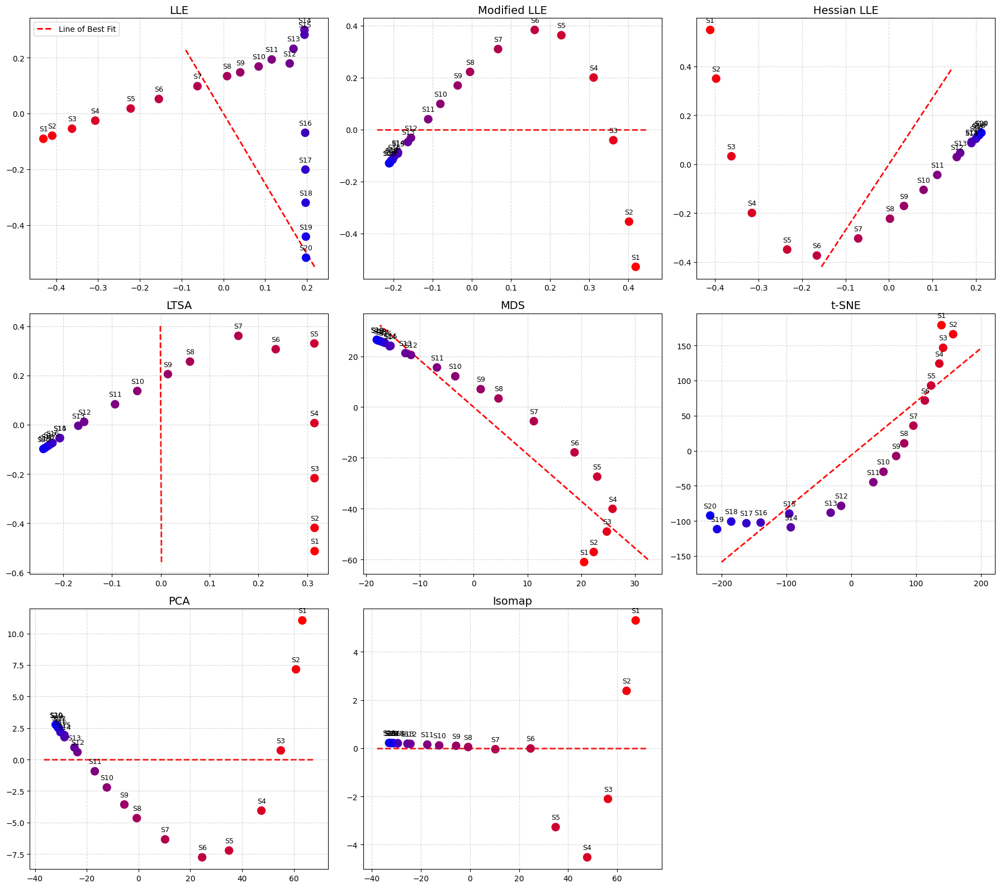

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# Setup the 3x3 subplot grid
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
axes = axes.flatten() # Flatten to make indexing easier (0 to 8)

# Loop through our saved embeddings dictionary
for idx, (name, emb) in enumerate(embeddings.items()):
    ax = axes[idx]
    
    # 1. Plot the original 2D scatter points
    # zorder=2 ensures the dots are drawn on top of the line
    ax.scatter(emb[:, 0], emb[:, 1], c=c11, s=100, zorder=2)
    
    # Annotate points with sample numbers
    for i in range(20):
        ax.annotate(f"S{i+1}", 
                     (emb[i, 0], emb[i, 1]),
                     textcoords="offset points", 
                     xytext=(0, 10), 
                     ha='center',
                     fontsize=9)
                     
    # 2. Compute the 1D PCA (Orthogonal Distance Regression)
    line_fitter = PCA(n_components=1)
    line_fitter.fit(emb)
    
    # 3. Find the endpoints of the line to draw it
    # We project the data to 1D, find the min and max, and inverse transform back to 2D
    projections = line_fitter.transform(emb)
    
    # We add a tiny bit of padding (e.g., 5%) so the line extends slightly past the outer dots
    pad = (projections.max() - projections.min()) * 0.05
    min_proj = projections.min() - pad
    max_proj = projections.max() + pad
    
    # Convert the 1D endpoints back into 2D space for plotting
    line_endpoints_2d = line_fitter.inverse_transform([[min_proj], [max_proj]])
    
    # 4. Plot the red line of best fit
    # zorder=1 draws it behind the scatter points
    ax.plot(line_endpoints_2d[:, 0], line_endpoints_2d[:, 1], color='red', 
            linestyle='--', linewidth=2, zorder=1, label="Line of Best Fit")
    
    # Formatting
    ax.set_title(name, fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Add a legend just to the first plot to avoid cluttering all of them
    if idx == 0: 
        ax.legend(loc='best')

# Hide the remaining two blank subplots (indices 7 and 8)
axes[8].axis('off')

plt.tight_layout()
plt.show()

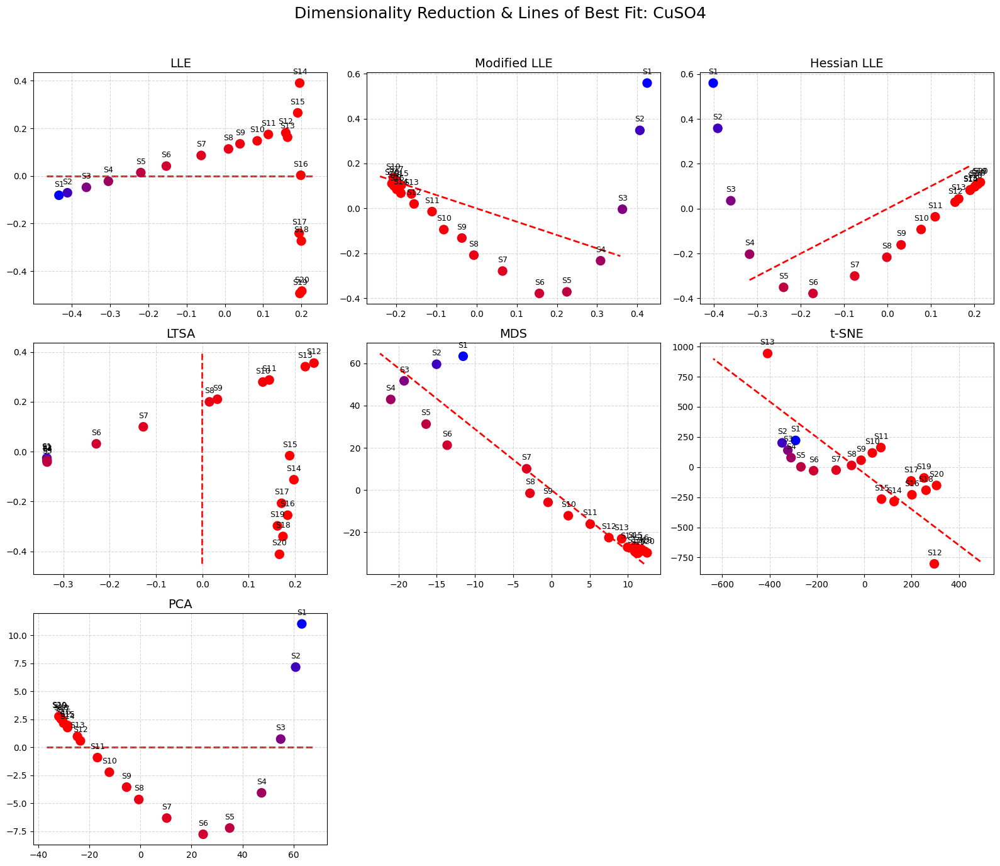

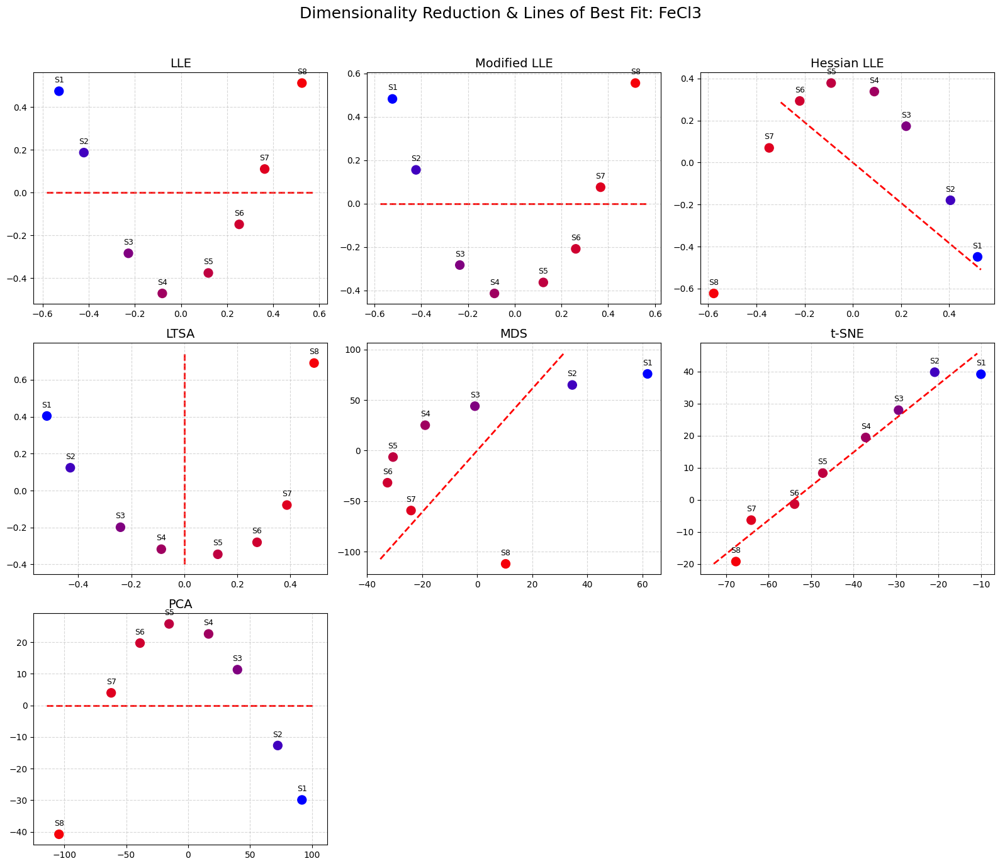

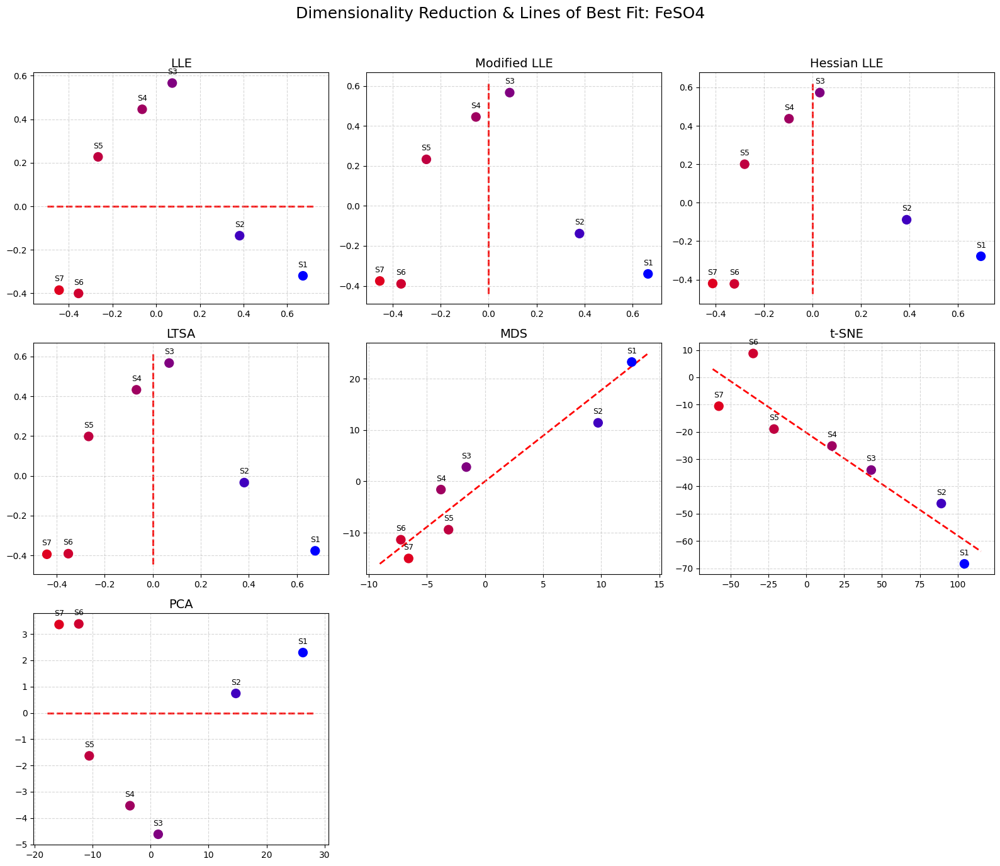

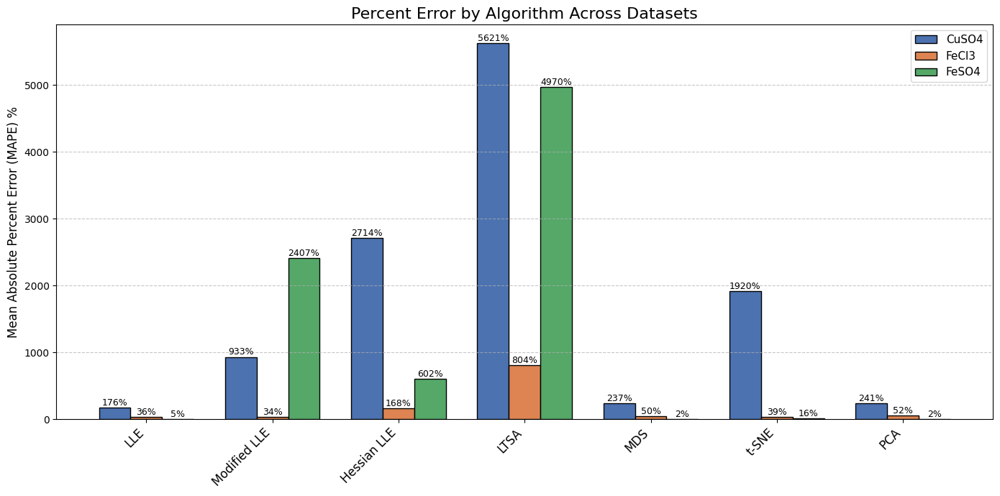

In [153]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import locally_linear_embedding, MDS, TSNE
from sklearn.decomposition import PCA
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# 1. Organize all three datasets into a dictionary structure
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

algorithm_names = ['LLE', 'Modified LLE', 'Hessian LLE', 'LTSA', 'MDS', 't-SNE', 'PCA']
errors_by_algo = {name: [] for name in algorithm_names}

# 2. Iterate through each dataset to compute embeddings, lines of best fit, and errors
for dataset_name, data in datasets.items():
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    num_samples = len(C_real)
    C_i = C_real[0]  
    C_f = C_real[-1] 
    
    # Dynamic neighbor constraints so small datasets (like n=7) don't crash
    k_standard = min(5, num_samples - 1)
    k_hessian = min(10, num_samples - 1) # Needs to be >= 6 theoretically
    k_ltsa = min(4, num_samples - 1)
    k_tsne = min(3, num_samples - 1)

    # --- Compute Embeddings ---
    embeddings = {}
    embeddings['LLE'], _ = locally_linear_embedding(X, n_neighbors=k_standard, n_components=2)
    embeddings['Modified LLE'], _ = locally_linear_embedding(X, n_neighbors=k_standard, n_components=2, method='modified')
    
    try:
        embeddings['Hessian LLE'], _ = locally_linear_embedding(X, n_neighbors=k_hessian, n_components=2, method='hessian')
    except Exception:
        # Fallback to standard LLE if the dataset is too small to compute the Hessian mathematically
        embeddings['Hessian LLE'] = embeddings['LLE']
        
    embeddings['LTSA'], _ = locally_linear_embedding(X, n_neighbors=k_ltsa, n_components=2, method='ltsa')
    embeddings['MDS'] = MDS(n_components=2, n_init=1, random_state=42).fit_transform(X)
    embeddings['t-SNE'] = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=k_tsne, random_state=42).fit_transform(X)
    embeddings['PCA'] = PCA(n_components=2).fit_transform(X)

    # --- Plot the 3x3 Grid for the Current Dataset ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 14))
    fig.suptitle(f"Dimensionality Reduction & Lines of Best Fit: {dataset_name}", fontsize=18, y=0.98)
    axes = axes.flatten()
    
    for idx, name in enumerate(algorithm_names):
        emb = embeddings[name]
        ax = axes[idx]
        
        # Plot Scatter
        ax.scatter(emb[:, 0], emb[:, 1], c=colors, s=100, zorder=2)
        for i in range(num_samples):
            ax.annotate(f"S{i+1}", (emb[i, 0], emb[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
            
        # 1D Projection for Line of Best Fit
        line_fitter = PCA(n_components=1)
        projections = line_fitter.fit_transform(emb).flatten()
        
        # Calculate Error for the Algorithm
        proj_i = projections[0]
        proj_f = projections[-1]
        if proj_f == proj_i:
            guesses = np.full_like(projections, C_i)
        else:
            guesses = C_i + (projections - proj_i) * (C_f - C_i) / (proj_f - proj_i)
            
        nonzero_mask = C_real != 0
        mape = np.mean(np.abs((guesses[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
        errors_by_algo[name].append(mape) # Store error to plot later
        
        # Plot Red Dashed Line
        pad = (projections.max() - projections.min()) * 0.05
        min_proj, max_proj = projections.min() - pad, projections.max() + pad
        line_endpoints = line_fitter.inverse_transform([[min_proj], [max_proj]])
        ax.plot(line_endpoints[:, 0], line_endpoints[:, 1], color='red', linestyle='--', linewidth=2, zorder=1)
        
        ax.set_title(name, fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.5)

    # Turn off blank plots
    axes[7].axis('off')
    axes[8].axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ==============================================================================
# 3. Plot the Grouped Bar Chart for % Error Across All 3 Datasets
# ==============================================================================

plt.figure(figsize=(14, 7))

x = np.arange(len(algorithm_names))  # the label locations
width = 0.25  # the width of the bars

# Unpack the errors for the 3 datasets
cu_errors = [errors_by_algo[name][0] for name in algorithm_names]
fe1_errors = [errors_by_algo[name][1] for name in algorithm_names]
fe2_errors = [errors_by_algo[name][2] for name in algorithm_names]

# Plot the grouped bars side-by-side
bars1 = plt.bar(x - width, cu_errors, width, label='CuSO4', color='#4C72B0', edgecolor='black')
bars2 = plt.bar(x, fe1_errors, width, label='FeCl3', color='#DD8452', edgecolor='black')
bars3 = plt.bar(x + width, fe2_errors, width, label='FeSO4', color='#55A868', edgecolor='black')

# Formatting
plt.ylabel('Mean Absolute Percent Error (MAPE) %', fontsize=12)
plt.title('Percent Error by Algorithm Across Datasets', fontsize=16)
plt.xticks(x, algorithm_names, rotation=45, ha='right', fontsize=12)
plt.legend(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Helper function to put values on top of bars
def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f"{yval:.0f}%", ha='center', va='bottom', fontsize=9)

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

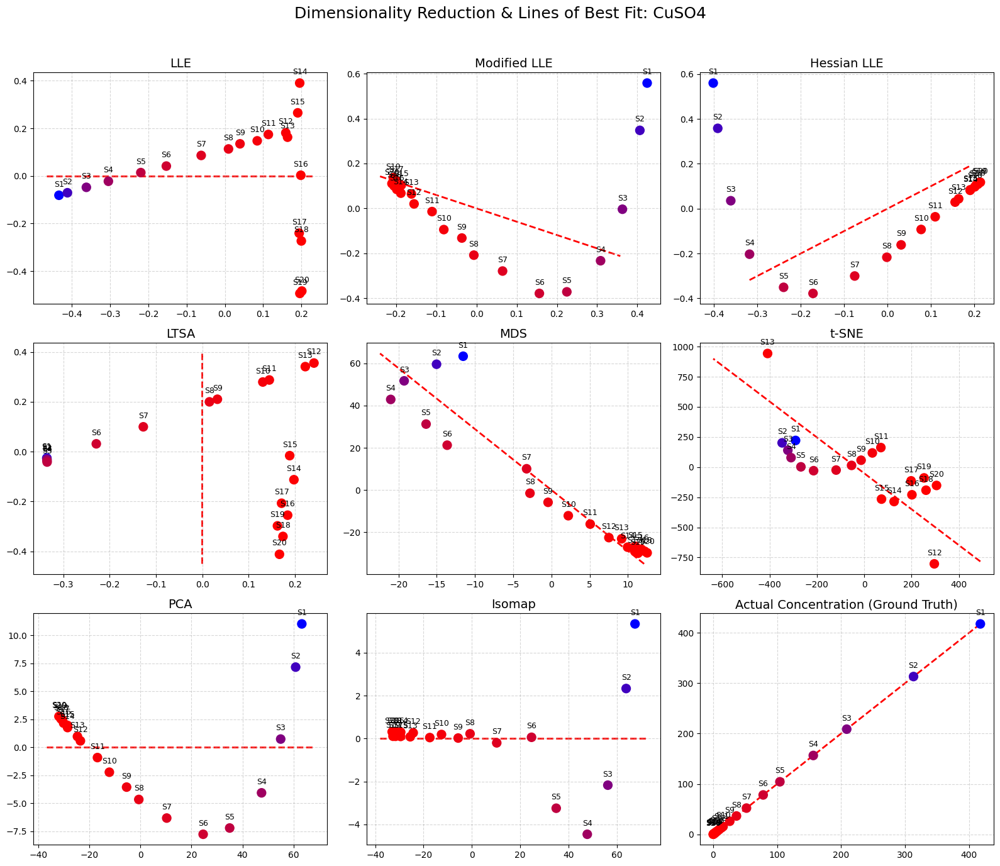

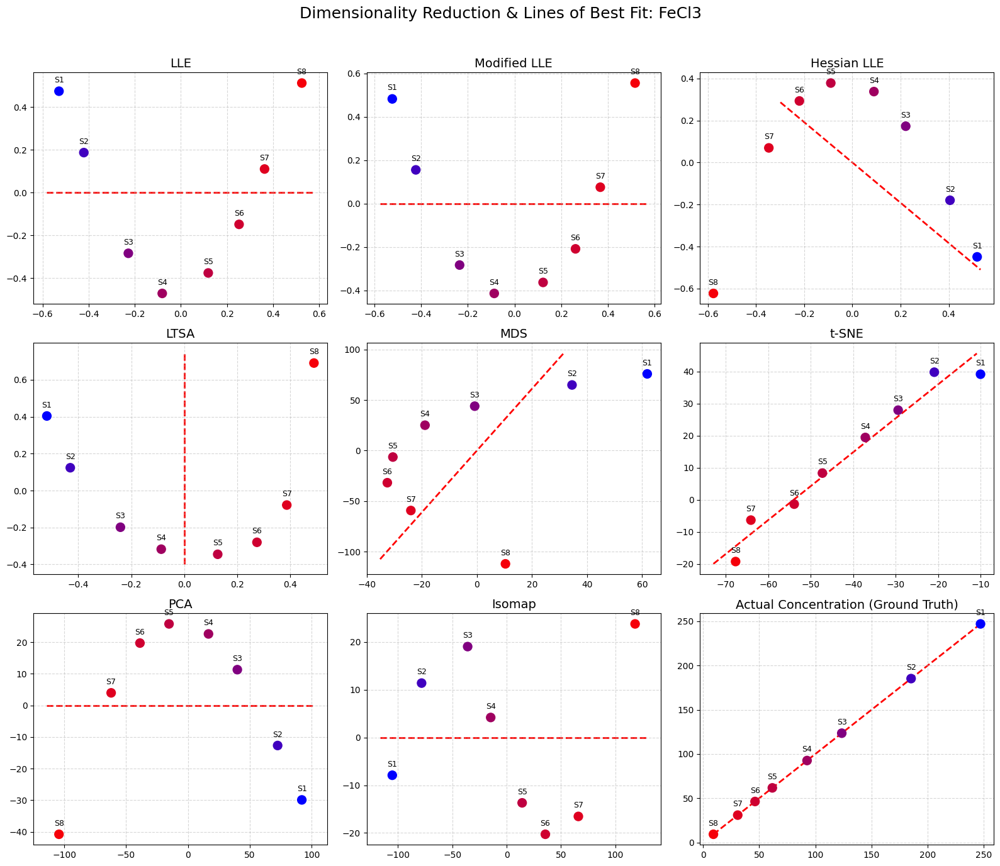

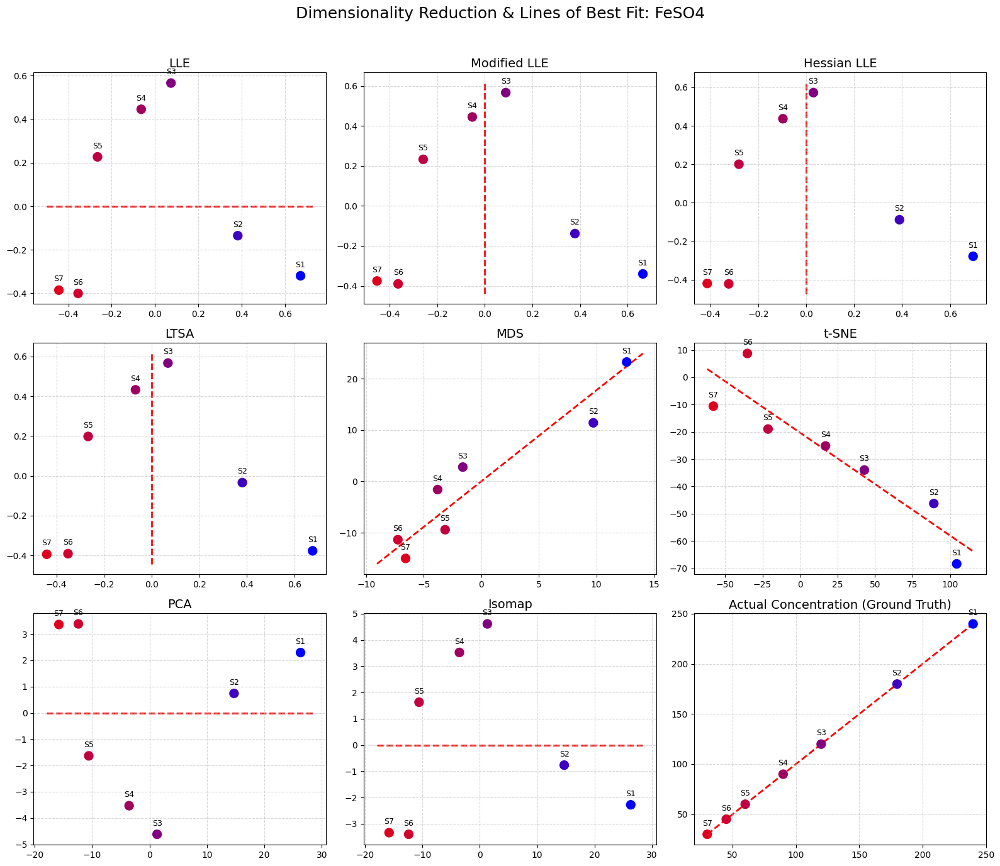

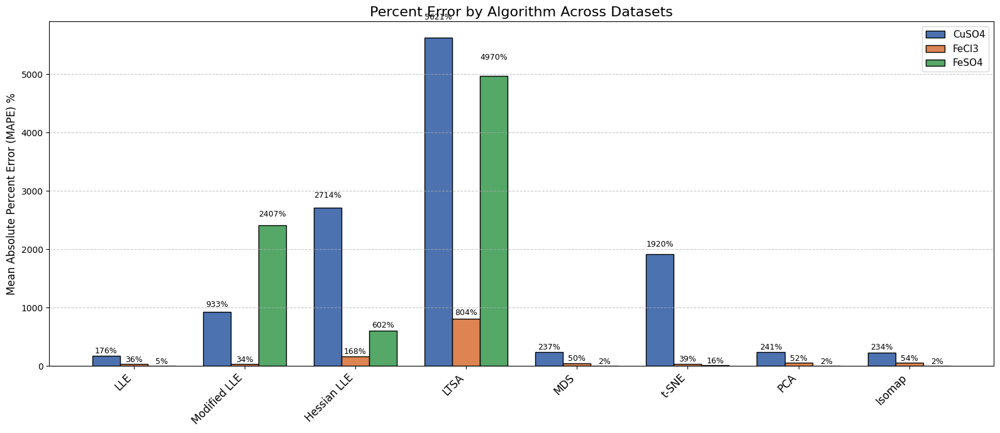

In [154]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import locally_linear_embedding, MDS, TSNE, Isomap
from sklearn.decomposition import PCA
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# 1. Organize all three datasets into a dictionary structure
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

# Added Isomap to the algorithms list
algorithm_names = ['LLE', 'Modified LLE', 'Hessian LLE', 'LTSA', 'MDS', 't-SNE', 'PCA', 'Isomap']
errors_by_algo = {name: [] for name in algorithm_names}

# 2. Iterate through each dataset to compute embeddings, lines of best fit, and errors
for dataset_name, data in datasets.items():
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    num_samples = len(C_real)
    C_i = C_real[0]  
    C_f = C_real[-1] 
    
    # Dynamic neighbor constraints so small datasets (like n=7) don't crash
    k_standard = min(5, num_samples - 1)
    k_hessian = min(10, num_samples - 1) # Needs to be >= 6 theoretically
    k_ltsa = min(4, num_samples - 1)
    k_tsne = min(3, num_samples - 1)

    # --- Compute Embeddings ---
    embeddings = {}
    embeddings['LLE'], _ = locally_linear_embedding(X, n_neighbors=k_standard, n_components=2)
    embeddings['Modified LLE'], _ = locally_linear_embedding(X, n_neighbors=k_standard, n_components=2, method='modified')
    
    try:
        embeddings['Hessian LLE'], _ = locally_linear_embedding(X, n_neighbors=k_hessian, n_components=2, method='hessian')
    except Exception:
        # Fallback to standard LLE if the dataset is too small to compute the Hessian mathematically
        embeddings['Hessian LLE'] = embeddings['LLE']
        
    embeddings['LTSA'], _ = locally_linear_embedding(X, n_neighbors=k_ltsa, n_components=2, method='ltsa')
    embeddings['MDS'] = MDS(n_components=2, n_init=1, random_state=42).fit_transform(X)
    embeddings['t-SNE'] = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=k_tsne, random_state=42).fit_transform(X)
    embeddings['PCA'] = PCA(n_components=2).fit_transform(X)
    
    # Compute Isomap
    embeddings['Isomap'] = Isomap(n_neighbors=k_standard, n_components=2).fit_transform(X)

    # --- Plot the 3x3 Grid for the Current Dataset ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 14))
    fig.suptitle(f"Dimensionality Reduction & Lines of Best Fit: {dataset_name}", fontsize=18, y=0.98)
    axes = axes.flatten()
    
    # Plot the 8 algorithms
    for idx, name in enumerate(algorithm_names):
        emb = embeddings[name]
        ax = axes[idx]
        
        # Plot Scatter
        ax.scatter(emb[:, 0], emb[:, 1], c=colors, s=100, zorder=2)
        for i in range(num_samples):
            ax.annotate(f"S{i+1}", (emb[i, 0], emb[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
            
        # 1D Projection for Line of Best Fit
        line_fitter = PCA(n_components=1)
        projections = line_fitter.fit_transform(emb).flatten()
        
        # Calculate Error for the Algorithm
        proj_i = projections[0]
        proj_f = projections[-1]
        if proj_f == proj_i:
            guesses = np.full_like(projections, C_i)
        else:
            guesses = C_i + (projections - proj_i) * (C_f - C_i) / (proj_f - proj_i)
            
        nonzero_mask = C_real != 0
        mape = np.mean(np.abs((guesses[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
        errors_by_algo[name].append(mape) # Store error to plot later
        
        # Plot Red Dashed Line
        pad = (projections.max() - projections.min()) * 0.05
        min_proj, max_proj = projections.min() - pad, projections.max() + pad
        line_endpoints = line_fitter.inverse_transform([[min_proj], [max_proj]])
        ax.plot(line_endpoints[:, 0], line_endpoints[:, 1], color='red', linestyle='--', linewidth=2, zorder=1)
        
        ax.set_title(name, fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.5)

    # --- Plot the 9th Graph: Actual Concentrations ---
    ax = axes[8]
    # Plotting C_real vs C_real creates the perfect "ground truth" diagonal
    ax.scatter(C_real, C_real, c=colors, s=100, zorder=2)
    for i in range(num_samples):
        ax.annotate(f"S{i+1}", (C_real[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
    
    # Draw the perfect line of best fit from min to max
    ax.plot([C_real.min(), C_real.max()], [C_real.min(), C_real.max()], color='red', linestyle='--', linewidth=2, zorder=1)
    ax.set_title("Actual Concentration (Ground Truth)", fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ==============================================================================
# 3. Plot the Grouped Bar Chart for % Error Across All 3 Datasets
# ==============================================================================

plt.figure(figsize=(16, 7))

x = np.arange(len(algorithm_names))  # the label locations
width = 0.25  # the width of the bars

# Unpack the errors for the 3 datasets
cu_errors = [errors_by_algo[name][0] for name in algorithm_names]
fe1_errors = [errors_by_algo[name][1] for name in algorithm_names]
fe2_errors = [errors_by_algo[name][2] for name in algorithm_names]

# Plot the grouped bars side-by-side
bars1 = plt.bar(x - width, cu_errors, width, label='CuSO4', color='#4C72B0', edgecolor='black')
bars2 = plt.bar(x, fe1_errors, width, label='FeCl3', color='#DD8452', edgecolor='black')
bars3 = plt.bar(x + width, fe2_errors, width, label='FeSO4', color='#55A868', edgecolor='black')

# Formatting
plt.ylabel('Mean Absolute Percent Error (MAPE) %', fontsize=12)
plt.title('Percent Error by Algorithm Across Datasets', fontsize=16)
plt.xticks(x, algorithm_names, rotation=45, ha='right', fontsize=12)
plt.legend(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Helper function to put values on top of bars
def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        # Ensure extremely tiny/zero values still render nicely
        offset = max(1, yval * 0.05) 
        plt.text(bar.get_x() + bar.get_width()/2, yval + offset, f"{yval:.0f}%", ha='center', va='bottom', fontsize=9)

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

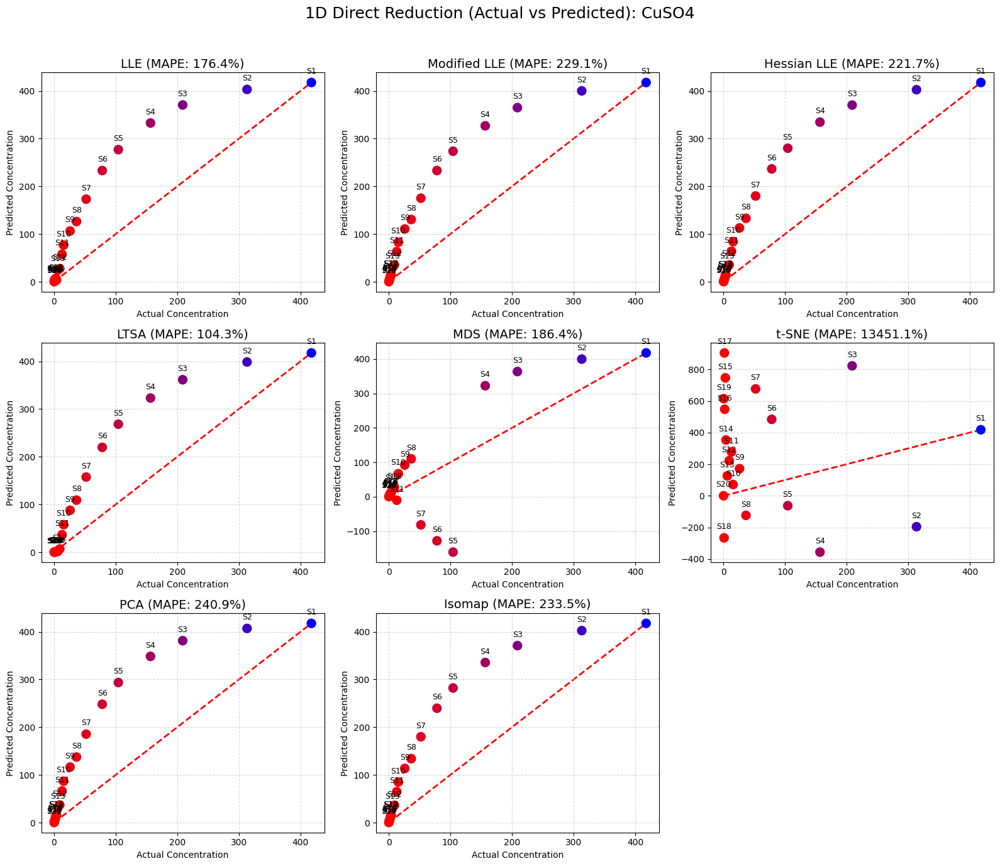

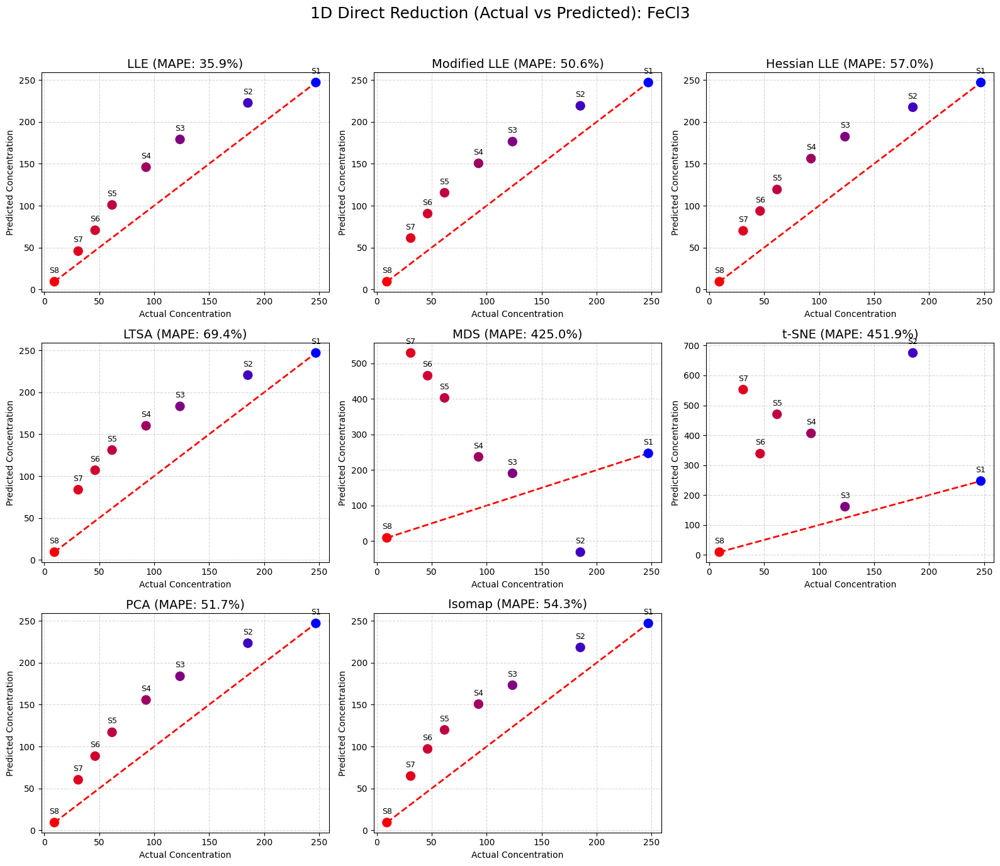

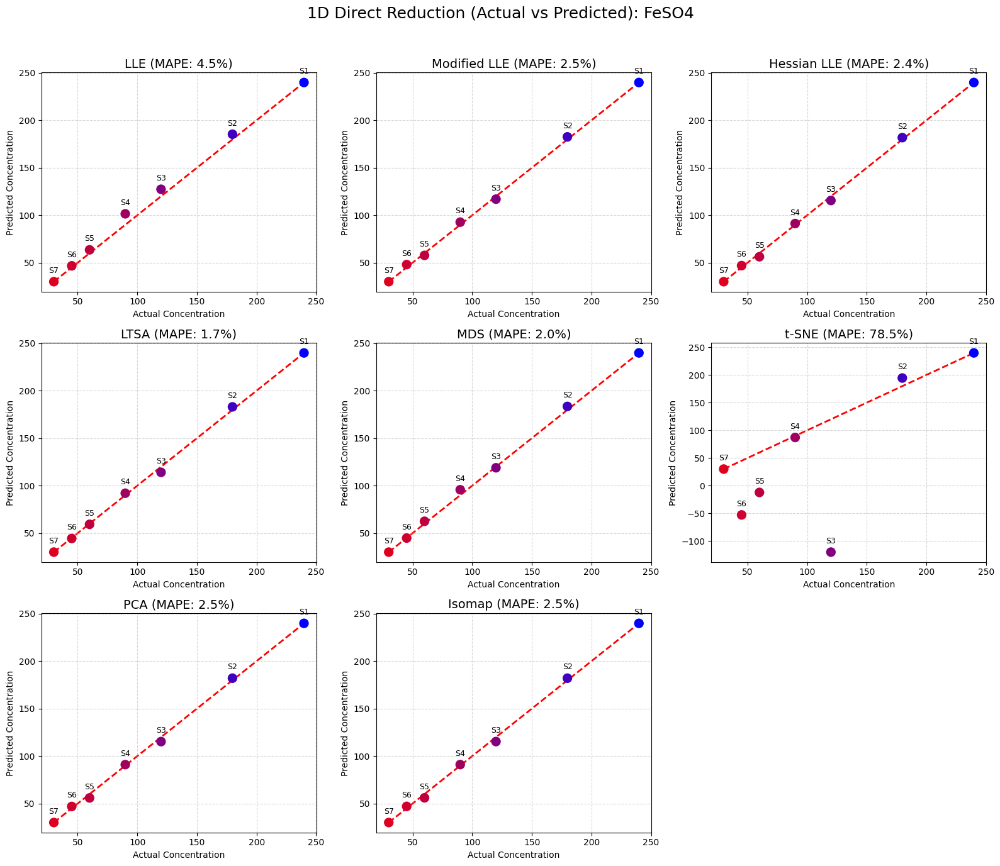

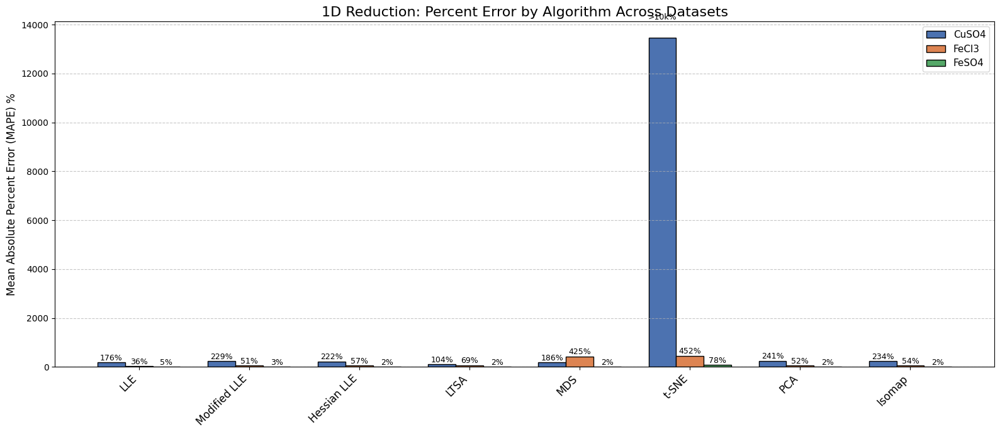

In [155]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import locally_linear_embedding, MDS, TSNE, Isomap
from sklearn.decomposition import PCA
import warnings

rs=1

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# 1. Organize all three datasets into a dictionary structure
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

algorithm_names = ['LLE', 'Modified LLE', 'Hessian LLE', 'LTSA', 'MDS', 't-SNE', 'PCA', 'Isomap']
errors_by_algo = {name: [] for name in algorithm_names}

# 2. Iterate through each dataset to compute 1D embeddings and errors
for dataset_name, data in datasets.items():
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    num_samples = len(C_real)
    C_i = C_real[0]  
    C_f = C_real[-1] 
    
    # Dynamic neighbor constraints
    k_standard = min(5, num_samples - 1)
    k_hessian = min(6, num_samples - 1) 
    k_ltsa = min(4, num_samples - 1)
    k_tsne = min(3, num_samples - 1)

    # --- Compute 1D Embeddings (Flattened to a simple array) ---
    embeddings_1d = {}
    embeddings_1d['LLE'] = locally_linear_embedding(X, n_neighbors=k_standard, n_components=1)[0].flatten()
    embeddings_1d['Modified LLE'] = locally_linear_embedding(X, n_neighbors=k_standard, n_components=1, method='modified')[0].flatten()
    
    try:
        embeddings_1d['Hessian LLE'] = locally_linear_embedding(X, n_neighbors=k_hessian, n_components=1, method='hessian')[0].flatten()
    except Exception:
        embeddings_1d['Hessian LLE'] = embeddings_1d['LLE']
        
    embeddings_1d['LTSA'] = locally_linear_embedding(X, n_neighbors=k_ltsa, n_components=1, method='ltsa')[0].flatten()
    embeddings_1d['MDS'] = MDS(n_components=1, n_init=1, random_state=42).fit_transform(X).flatten()
    embeddings_1d['t-SNE'] = TSNE(n_components=1, learning_rate='auto', init='random', perplexity=k_tsne, random_state=rs).fit_transform(X).flatten()
    embeddings_1d['PCA'] = PCA(n_components=1).fit_transform(X).flatten()
    embeddings_1d['Isomap'] = Isomap(n_neighbors=k_standard, n_components=1).fit_transform(X).flatten()

    # --- Plot the 3x3 Grid (Actual vs Predicted) ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 14))
    fig.suptitle(f"1D Direct Reduction (Actual vs Predicted): {dataset_name}", fontsize=18, y=0.98)
    axes = axes.flatten()
    
    for idx, name in enumerate(algorithm_names):
        projections = embeddings_1d[name]
        ax = axes[idx]
        
        # Calculate Concentration Guesses from the 1D projection
        proj_i = projections[0]
        proj_f = projections[-1]
        
        if proj_f == proj_i:
            guesses = np.full_like(projections, C_i)
        else:
            guesses = C_i + (projections - proj_i) * (C_f - C_i) / (proj_f - proj_i)
            
        # Calculate Error for the Algorithm
        nonzero_mask = C_real != 0
        mape = np.mean(np.abs((guesses[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
        errors_by_algo[name].append(mape)
        
        # Plot Scatter (Actual vs Predicted)
        ax.scatter(C_real, guesses, c=colors, s=100, zorder=2)
        for i in range(num_samples):
            ax.annotate(f"S{i+1}", (C_real[i], guesses[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
            
        # Plot Perfect Correlation Line (y=x)
        min_val, max_val = C_real.min(), C_real.max()
        ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, zorder=1, label="Perfect Prediction")
        
        ax.set_title(f"{name} (MAPE: {mape:.1f}%)", fontsize=14)
        ax.set_xlabel("Actual Concentration")
        ax.set_ylabel("Predicted Concentration")
        ax.grid(True, linestyle='--', alpha=0.5)

    # --- 9th Plot: Blank or Summary ---
    axes[8].axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ==============================================================================
# 3. Plot the Grouped Bar Chart for % Error Across All 3 Datasets
# ==============================================================================

plt.figure(figsize=(16, 7))

x = np.arange(len(algorithm_names))  
width = 0.25  

# Unpack the errors for the 3 datasets
cu_errors = [errors_by_algo[name][0] for name in algorithm_names]
fe1_errors = [errors_by_algo[name][1] for name in algorithm_names]
fe2_errors = [errors_by_algo[name][2] for name in algorithm_names]

# Plot grouped bars
bars1 = plt.bar(x - width, cu_errors, width, label='CuSO4', color='#4C72B0', edgecolor='black')
bars2 = plt.bar(x, fe1_errors, width, label='FeCl3', color='#DD8452', edgecolor='black')
bars3 = plt.bar(x + width, fe2_errors, width, label='FeSO4', color='#55A868', edgecolor='black')

# Formatting
plt.ylabel('Mean Absolute Percent Error (MAPE) %', fontsize=12)
plt.title('1D Reduction: Percent Error by Algorithm Across Datasets', fontsize=16)
plt.xticks(x, algorithm_names, rotation=45, ha='right', fontsize=12)
plt.legend(fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)

def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        # Cap visual text at a reasonable value if it exploded to thousands of %
        display_val = f"{yval:.0f}%" if yval < 10000 else ">10k%"
        offset = max(1, yval * 0.05) 
        plt.text(bar.get_x() + bar.get_width()/2, yval + offset, display_val, ha='center', va='bottom', fontsize=9)

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

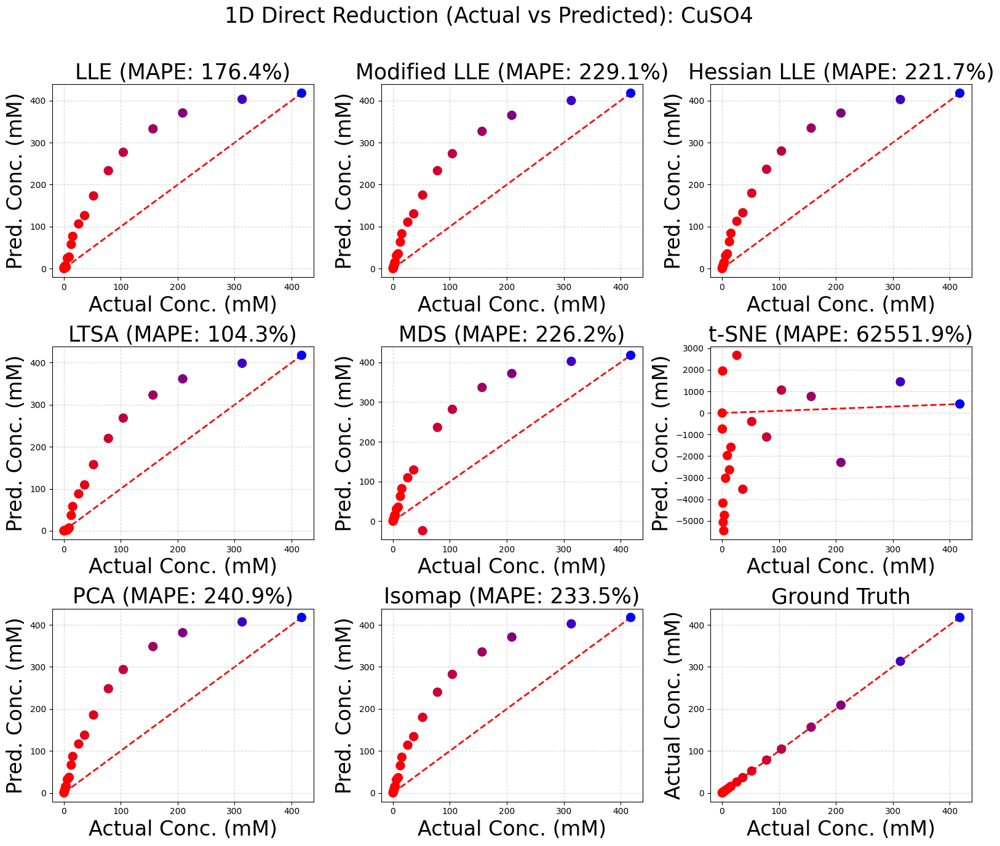

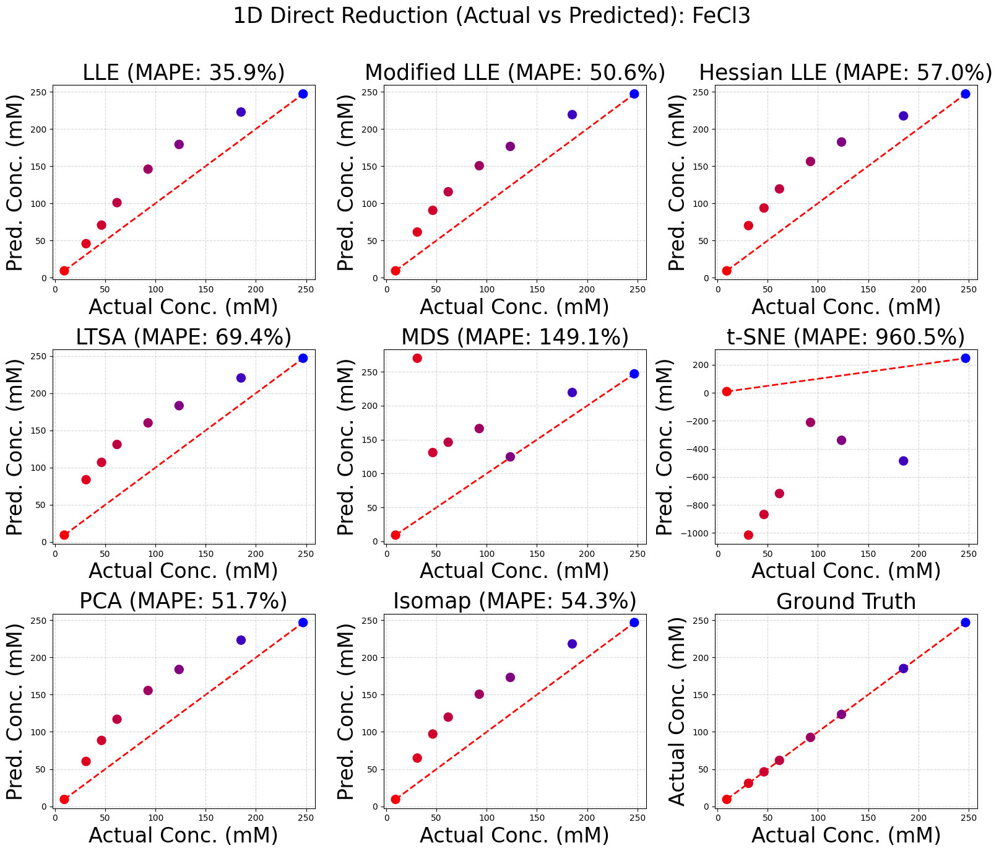

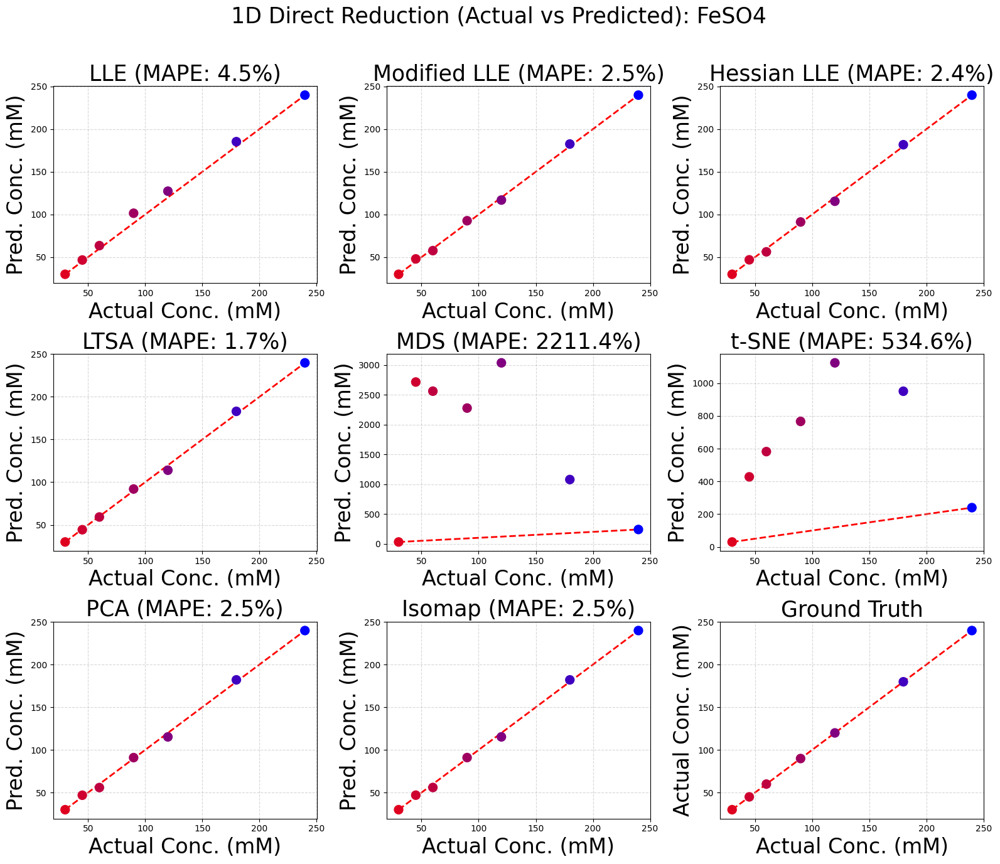

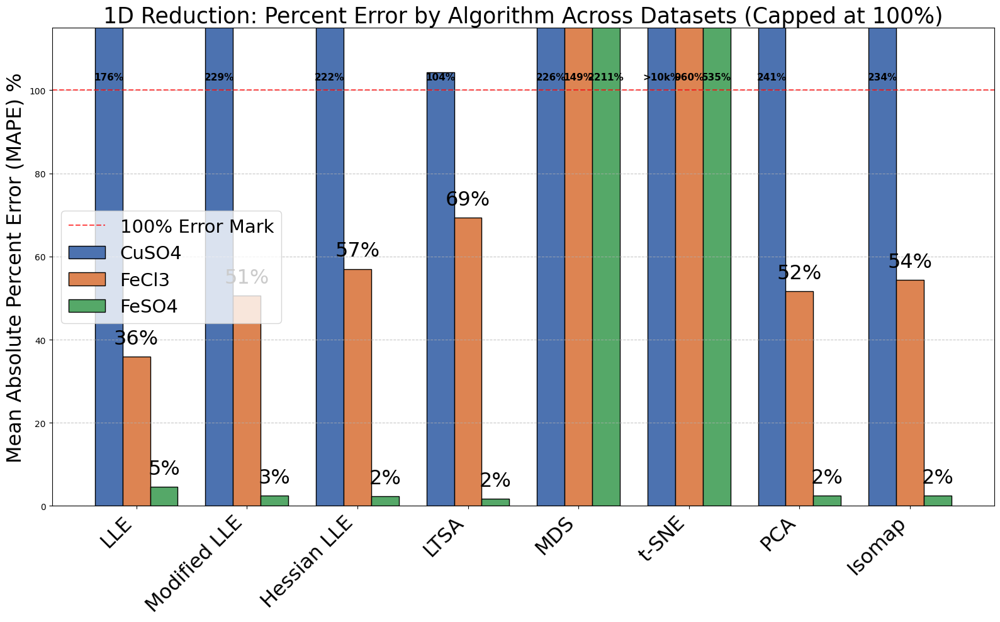

In [212]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import locally_linear_embedding, MDS, TSNE, Isomap
from sklearn.decomposition import PCA
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# --- PARAMETERS ---
rs = 9496  # Random seed for t-SNE and MDS
fs = 25

# 1. Organize all three datasets into a dictionary structure
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}
algorithm_names = ['LLE', 'Modified LLE', 'Hessian LLE', 'LTSA', 'MDS', 't-SNE', 'PCA', 'Isomap']
errors_by_algo = {name: [] for name in algorithm_names}

# 2. Iterate through each dataset to compute 1D embeddings and errors
for dataset_name, data in datasets.items():
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    num_samples = len(C_real)
    C_i = C_real[0]  
    C_f = C_real[-1] 
    
    # Dynamic neighbor constraints
    k_standard = min(5, num_samples - 1)
    k_hessian = min(6, num_samples - 1) 
    k_ltsa = min(4, num_samples - 1)
    k_tsne = min(3, num_samples - 1)

    # --- Compute 1D Embeddings (Flattened to a simple array) ---
    embeddings_1d = {}
    embeddings_1d['LLE'] = locally_linear_embedding(X, n_neighbors=k_standard, n_components=1)[0].flatten()
    embeddings_1d['Modified LLE'] = locally_linear_embedding(X, n_neighbors=k_standard, n_components=1, method='modified')[0].flatten()
    
    try:
        embeddings_1d['Hessian LLE'] = locally_linear_embedding(X, n_neighbors=k_hessian, n_components=1, method='hessian')[0].flatten()
    except Exception:
        embeddings_1d['Hessian LLE'] = embeddings_1d['LLE']
        
    embeddings_1d['LTSA'] = locally_linear_embedding(X, n_neighbors=k_ltsa, n_components=1, method='ltsa')[0].flatten()
    embeddings_1d['MDS'] = MDS(n_components=1, n_init=1, random_state=rs).fit_transform(X).flatten()
    embeddings_1d['t-SNE'] = TSNE(n_components=1, learning_rate='auto', init='random', perplexity=k_tsne, random_state=rs).fit_transform(X).flatten()
    embeddings_1d['PCA'] = PCA(n_components=1).fit_transform(X).flatten()
    embeddings_1d['Isomap'] = Isomap(n_neighbors=k_standard, n_components=1).fit_transform(X).flatten()

    # --- Plot the 3x3 Grid (Actual vs Predicted) ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 14))
    fig.suptitle(f"1D Direct Reduction (Actual vs Predicted): {dataset_name}", fontsize=fs, y=0.98)
    axes = axes.flatten()
    
    for idx, name in enumerate(algorithm_names):
        projections = embeddings_1d[name]
        ax = axes[idx]
        
        # Calculate Concentration Guesses from the 1D projection
        proj_i = projections[0]
        proj_f = projections[-1]
        
        if proj_f == proj_i:
            guesses = np.full_like(projections, C_i)
        else:
            guesses = C_i + (projections - proj_i) * (C_f - C_i) / (proj_f - proj_i)
            
        # Calculate Error for the Algorithm
        nonzero_mask = C_real != 0
        mape = np.mean(np.abs((guesses[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
        errors_by_algo[name].append(mape)
        
        # Plot Scatter (Actual vs Predicted)
        ax.scatter(C_real, guesses, c=colors, s=100, zorder=2)
        #for i in range(num_samples):
        #    ax.annotate(f"S{i+1}", (C_real[i], guesses[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
            
        # Plot Perfect Correlation Line (y=x)
        min_val, max_val = C_real.min(), C_real.max()
        ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, zorder=1, label="Perfect Prediction")
        
        ax.set_title(f"{name} (MAPE: {mape:.1f}%)", fontsize=fs)
        ax.set_xlabel("Actual Conc. (mM)",fontsize = fs-1)
        ax.set_ylabel("Pred. Conc. (mM)",fontsize = fs-1)
        ax.grid(True, linestyle='--', alpha=0.5)

    # --- 9th Plot: Actual Concentrations ---
    ax = axes[8]
    ax.scatter(C_real, C_real, c=colors, s=100, zorder=2)
    #for i in range(num_samples):
    #    ax.annotate(f"S{i+1}", (C_real[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    min_val, max_val = C_real.min(), C_real.max()
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, zorder=1, label="Perfect Prediction")
    
    ax.set_title("Ground Truth", fontsize=fs)
    ax.set_xlabel("Actual Conc. (mM)",fontsize = fs-1)
    ax.set_ylabel("Actual Conc. (mM)",fontsize = fs-1)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# ==============================================================================
# 3. Plot the Grouped Bar Chart for % Error Across All 3 Datasets
# ==============================================================================

plt.figure(figsize=(16, 10))

x = np.arange(len(algorithm_names))  
width = 0.25  

# Unpack the errors for the 3 datasets
cu_errors = [errors_by_algo[name][0] for name in algorithm_names]
fe1_errors = [errors_by_algo[name][1] for name in algorithm_names]
fe2_errors = [errors_by_algo[name][2] for name in algorithm_names]

# Plot grouped bars
bars1 = plt.bar(x - width, cu_errors, width, label='CuSO4', color='#4C72B0', edgecolor='black')
bars2 = plt.bar(x, fe1_errors, width, label='FeCl3', color='#DD8452', edgecolor='black')
bars3 = plt.bar(x + width, fe2_errors, width, label='FeSO4', color='#55A868', edgecolor='black')

# Formatting - Break the Y-axis visually
plt.ylim(0, 115) 
plt.axhline(100, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='100% Error Mark')

plt.ylabel('Mean Absolute Percent Error (MAPE) %', fontsize=fs-2)
plt.title('1D Reduction: Percent Error by Algorithm Across Datasets (Capped at 100%)', fontsize=fs)
plt.xticks(x, algorithm_names, rotation=45, ha='right', fontsize=fs-2)
plt.legend(fontsize=fs-4)
plt.grid(axis='y', linestyle='--', alpha=0.7)

def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        display_val = f"{yval:.0f}%" if yval < 10000 else ">10k%"
        
        # If the actual percentage is >100, lock the text at height 102 so it stays perfectly visible 
        # below the 115 limit, hovering just above the 100% line.
        text_y = yval + 2
        font_weight = 'normal'
        font_size = fs-2
        if yval > 100:
            text_y = 102
            font_weight = 'bold' # Bold text for extremely high errors
            font_size = fs-14
            
        plt.text(bar.get_x() + bar.get_width()/2, text_y, display_val, 
                 ha='center', va='bottom', fontsize=font_size, fontweight=font_weight)

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

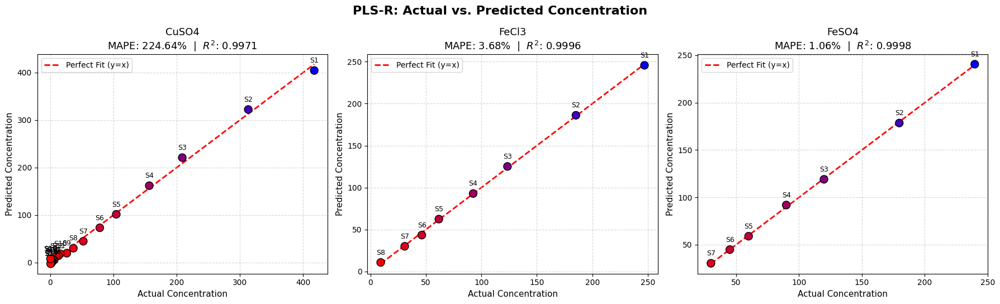

--- PLS-R Accuracy Summary ---
CuSO4   : MAPE = 224.64%  |  R² = 0.9971
FeCl3   : MAPE =  3.68%  |  R² = 0.9996
FeSO4   : MAPE =  1.06%  |  R² = 0.9998


In [157]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import r2_score
import warnings

warnings.filterwarnings("ignore")

# 1. Organize all three datasets into a dictionary structure
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

# 2. Setup the Plotting Canvas
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))
fig.suptitle("PLS-R: Actual vs. Predicted Concentration", fontsize=16, fontweight='bold')

mapes = []
r2_scores = []

# 3. Iterate, Fit, and Plot
for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # We restrict PLS-R to a small number of components (e.g., 3). 
    # Using too many components will memorize the instrumental noise.
    n_comp = min(3, len(C_real) - 1)
    
    # Initialize and fit the PLS-R model
    # Note: sklearn's PLSRegression automatically centers and scales the data by default
    pls = PLSRegression(n_components=n_comp)
    pls.fit(X, C_real)
    
    # Predict the concentrations using the fitted model
    C_pred = pls.predict(X).flatten()
    
    # Calculate Error (MAPE)
    nonzero_mask = C_real != 0
    mape = np.mean(np.abs((C_pred[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    mapes.append(mape)
    
    # Calculate Goodness of Fit (R-squared)
    r2 = r2_score(C_real, C_pred)
    r2_scores.append(r2)
    
    # --- Plot the Parity Graph (Actual vs Predicted) ---
    ax = axes[idx]
    
    # Scatter plot of the predictions
    ax.scatter(C_real, C_pred, c=colors, s=100, zorder=2, edgecolor='k')
    
    # Annotate the points
    for i in range(len(C_real)):
        ax.annotate(f"S{i+1}", (C_real[i], C_pred[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    # Draw the perfect prediction line (y = x)
    min_val, max_val = C_real.min(), C_real.max()
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, zorder=1, label="Perfect Fit (y=x)")
    
    # Formatting
    ax.set_title(f"{dataset_name}\nMAPE: {mape:.2f}%  |  $R^2$: {r2:.4f}", fontsize=13)
    ax.set_xlabel("Actual Concentration", fontsize=11)
    ax.set_ylabel("Predicted Concentration", fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='best')

plt.tight_layout()
plt.show()

# Print text summary
print("--- PLS-R Accuracy Summary ---")
for name, m, r in zip(datasets.keys(), mapes, r2_scores):
    print(f"{name: <8}: MAPE = {m:>5.2f}%  |  R² = {r:.4f}")

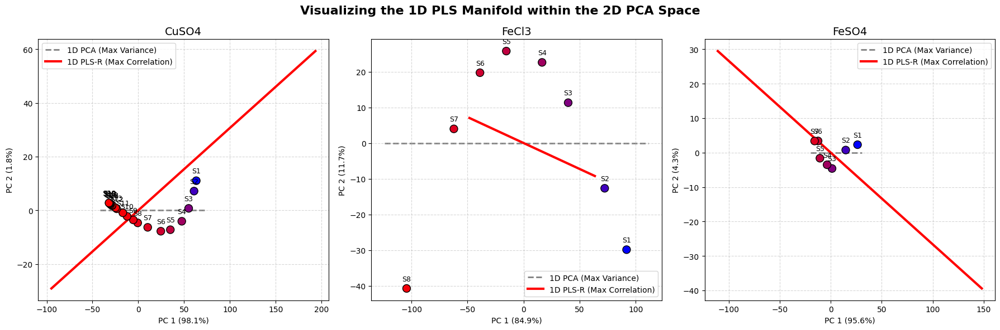

In [158]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
import warnings

warnings.filterwarnings("ignore")

# 1. Organize datasets
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Visualizing the 1D PLS Manifold within the 2D PCA Space", fontsize=16, fontweight='bold')

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    ax = axes[idx]
    
    # --- Step 1: Create the 2D PCA Space ---
    pca_2d = PCA(n_components=2)
    X_pca_2d = pca_2d.fit_transform(X)
    
    # Plot the scatter points
    ax.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=colors, s=100, zorder=3, edgecolor='k')
    for i in range(len(C_real)):
        ax.annotate(f"S{i+1}", (X_pca_2d[i, 0], X_pca_2d[i, 1]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    # --- Step 2: Calculate 1D PCA (Unsupervised Line of Best Fit) ---
    pca_1d = PCA(n_components=1)
    pca_1d_scores = pca_1d.fit_transform(X)
    
    # Generate points along the PCA 1D line and map them to 2D PCA space
    p_min, p_max = pca_1d_scores.min(), pca_1d_scores.max()
    pad_p = (p_max - p_min) * 0.1
    p_line = np.linspace(p_min - pad_p, p_max + pad_p, 100).reshape(-1, 1)
    
    # Inverse transform to 9000D, then forward transform to 2D
    X_pca_line_9000D = pca_1d.inverse_transform(p_line)
    PCA_line_2D = pca_2d.transform(X_pca_line_9000D)
    
    # Plot PCA line
    ax.plot(PCA_line_2D[:, 0], PCA_line_2D[:, 1], color='gray', linestyle='--', linewidth=2, zorder=1, label='1D PCA (Max Variance)')

    # --- Step 3: Calculate 1D PLS-R (Supervised Manifold) ---
    pls_1d = PLSRegression(n_components=1)
    pls_1d.fit(X, C_real)
    
    # Extract the PLS scores (where the points land on the 1D manifold)
    pls_1d_scores = pls_1d.transform(X)
    
    # Generate points along the PLS 1D line
    t_min, t_max = pls_1d_scores.min(), pls_1d_scores.max()
    pad_t = (t_max - t_min) * 0.1
    t_line = np.linspace(t_min - pad_t, t_max + pad_t, 100).reshape(-1, 1)
    
    # Inverse transform PLS back to 9000D space
    # PLS formula: X_recon = T * P^T + X_mean
    # Handle sklearn version differences for the mean attribute
    x_mean = getattr(pls_1d, '_x_mean', getattr(pls_1d, 'x_mean_', np.mean(X, axis=0)))
    X_pls_line_9000D = np.dot(t_line, pls_1d.x_loadings_.T) + x_mean
    
    # Map the 9000D PLS line into the 2D PCA space
    PLS_line_2D = pca_2d.transform(X_pls_line_9000D)
    
    # Plot PLS line
    ax.plot(PLS_line_2D[:, 0], PLS_line_2D[:, 1], color='red', linestyle='-', linewidth=3, zorder=2, label='1D PLS-R (Max Correlation)')
    
    # Formatting
    var_1 = pca_2d.explained_variance_ratio_[0] * 100
    var_2 = pca_2d.explained_variance_ratio_[1] * 100
    ax.set_title(dataset_name, fontsize=14)
    ax.set_xlabel(f"PC 1 ({var_1:.1f}%)")
    ax.set_ylabel(f"PC 2 ({var_2:.1f}%)")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

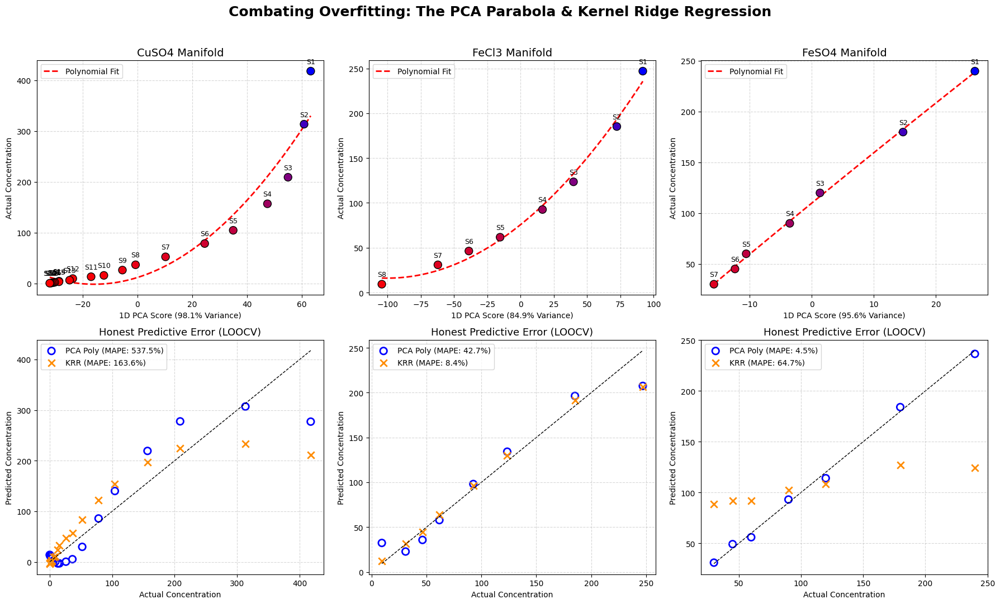

In [159]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import LeaveOneOut
from sklearn.pipeline import make_pipeline
import warnings

warnings.filterwarnings("ignore")

# 1. Organize datasets
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle("Combating Overfitting: The PCA Parabola & Kernel Ridge Regression", fontsize=18, fontweight='bold', y=0.98)

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # ==========================================
    # MODEL DEFINITIONS
    # ==========================================
    # Model 1: The PCA Parabola (NL-PCR)
    # 9000D -> 1D PCA -> 2nd Degree Polynomial -> Concentration (3 Parameters total)
    pca_poly_model = make_pipeline(PCA(n_components=1), PolynomialFeatures(degree=2), LinearRegression())
    
    # Model 2: Kernel Ridge Regression
    # Solves in the dual space using an n x n kernel matrix (n Parameters total)
    # alpha controls regularization (smoothness), degree=2 allows parabolic mapping
    krr_model = KernelRidge(kernel='poly', degree=2, alpha=1.0)
    
    # ==========================================
    # LEAVE-ONE-OUT CROSS-VALIDATION (LOOCV)
    # ==========================================
    loo = LeaveOneOut()
    y_pred_pca = np.zeros_like(C_real)
    y_pred_krr = np.zeros_like(C_real)
    
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = C_real[train_index], C_real[test_index]
        
        # Fit and predict PCA Parabola
        pca_poly_model.fit(X_train, y_train)
        y_pred_pca[test_index] = pca_poly_model.predict(X_test)
        
        # Fit and predict Kernel Ridge
        krr_model.fit(X_train, y_train)
        y_pred_krr[test_index] = krr_model.predict(X_test)
        
    # Calculate LOOCV Error (MAPE)
    nonzero_mask = C_real != 0
    mape_pca = np.mean(np.abs((y_pred_pca[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    mape_krr = np.mean(np.abs((y_pred_krr[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100

    # ==========================================
    # PLOTTING ROW 1: Visualizing the PCA Parabola
    # ==========================================
    ax_top = axes[0, idx]
    
    # Fit the PCA and Polynomial on ALL data just for the visual curve
    pca = PCA(n_components=1)
    X_pc1 = pca.fit_transform(X)
    poly = PolynomialFeatures(degree=2)
    lr = LinearRegression()
    lr.fit(poly.fit_transform(X_pc1), C_real)
    
    # Plot the scattered samples
    ax_top.scatter(X_pc1, C_real, c=colors, s=100, edgecolor='k', zorder=3)
    for i in range(len(C_real)):
        ax_top.annotate(f"S{i+1}", (X_pc1[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    # Generate and plot the smooth parabola
    x_line = np.linspace(X_pc1.min(), X_pc1.max(), 100).reshape(-1, 1)
    y_line = lr.predict(poly.transform(x_line))
    ax_top.plot(x_line, y_line, color='red', linewidth=2, linestyle='--', zorder=2, label="Polynomial Fit")
    
    var_explained = pca.explained_variance_ratio_[0] * 100
    ax_top.set_title(f"{dataset_name} Manifold", fontsize=14)
    ax_top.set_xlabel(f"1D PCA Score ({var_explained:.1f}% Variance)")
    ax_top.set_ylabel("Actual Concentration")
    ax_top.grid(True, linestyle='--', alpha=0.5)
    ax_top.legend()

    # ==========================================
    # PLOTTING ROW 2: LOOCV Parity Plot
    # ==========================================
    ax_bot = axes[1, idx]
    
    # Plot LOOCV predictions for both models
    ax_bot.scatter(C_real, y_pred_pca, marker='o', s=80, facecolors='none', edgecolors='blue', linewidth=2, label=f'PCA Poly (MAPE: {mape_pca:.1f}%)')
    ax_bot.scatter(C_real, y_pred_krr, marker='x', s=80, color='darkorange', linewidth=2, label=f'KRR (MAPE: {mape_krr:.1f}%)')
    
    # Perfect fit line
    min_val, max_val = C_real.min(), C_real.max()
    ax_bot.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=1, zorder=1)
    
    ax_bot.set_title(f"Honest Predictive Error (LOOCV)", fontsize=13)
    ax_bot.set_xlabel("Actual Concentration")
    ax_bot.set_ylabel("Predicted Concentration")
    ax_bot.grid(True, linestyle='--', alpha=0.5)
    ax_bot.legend(loc='best')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

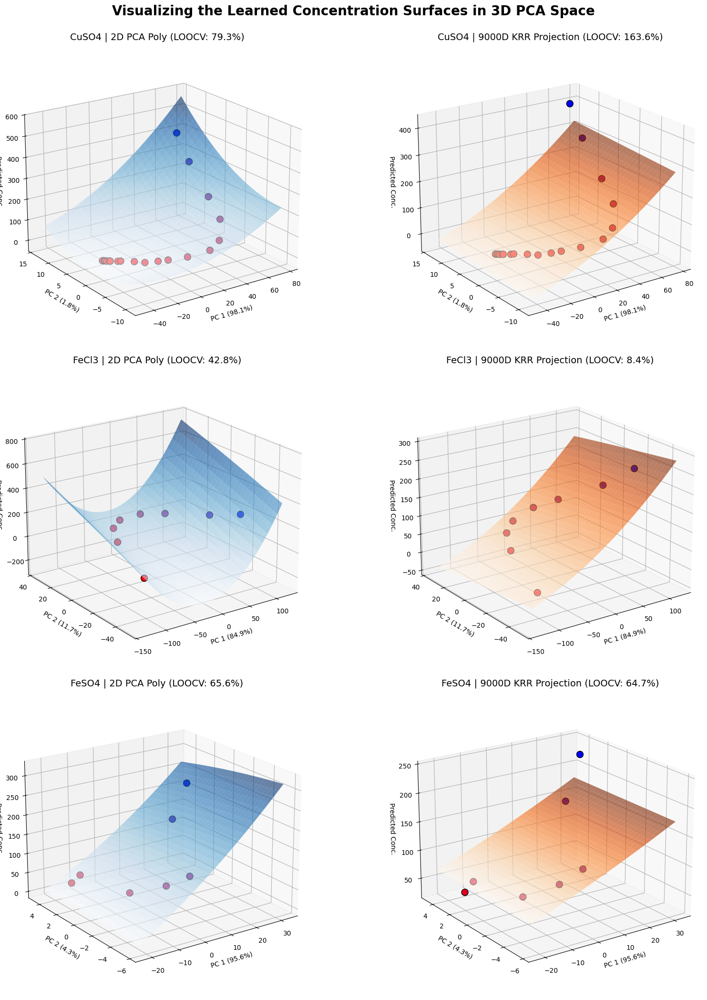

In [160]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import LeaveOneOut
import warnings

warnings.filterwarnings("ignore")

# 1. Organize datasets
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

# Create a figure with 3 rows (datasets) and 2 columns (Algorithms), projecting in 3D
fig = plt.figure(figsize=(18, 22))
fig.suptitle("Visualizing the Learned Concentration Surfaces in 3D PCA Space", fontsize=20, fontweight='bold', y=0.95)

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # ==========================================
    # HONEST ERROR CALCULATION (LOOCV)
    # ==========================================
    loo = LeaveOneOut()
    y_pred_pca2 = np.zeros_like(C_real)
    y_pred_krr = np.zeros_like(C_real)
    
    for train_idx, test_idx in loo.split(X):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train = C_real[train_idx]
        
        # 1. PCA 2D -> Poly Degree 2 LOOCV
        pca_temp = PCA(n_components=2)
        X_pca_train = pca_temp.fit_transform(X_train)
        X_pca_test = pca_temp.transform(X_test)
        
        poly_temp = PolynomialFeatures(degree=2)
        X_poly_train = poly_temp.fit_transform(X_pca_train)
        X_poly_test = poly_temp.transform(X_pca_test)
        
        lr_temp = LinearRegression().fit(X_poly_train, y_train)
        y_pred_pca2[test_idx] = lr_temp.predict(X_poly_test)
        
        # 2. KRR 9000D LOOCV
        krr_temp = KernelRidge(kernel='poly', degree=2, alpha=1.0).fit(X_train, y_train)
        y_pred_krr[test_idx] = krr_temp.predict(X_test)
        
    nonzero_mask = C_real != 0
    mape_pca2 = np.mean(np.abs((y_pred_pca2[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    mape_krr = np.mean(np.abs((y_pred_krr[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100

    # ==========================================
    # FIT FINAL MODELS FOR 3D VISUALIZATION
    # ==========================================
    # Fit PCA and extract 2D coordinates for the data
    pca = PCA(n_components=2)
    X_pca2 = pca.fit_transform(X)
    
    # Fit the PCA-Poly model
    poly = PolynomialFeatures(degree=2)
    lr = LinearRegression().fit(poly.fit_transform(X_pca2), C_real)
    
    # Fit the 9000D KRR model
    krr = KernelRidge(kernel='poly', degree=2, alpha=1.0).fit(X, C_real)

    # ==========================================
    # GENERATE THE 2D GRID SURFACE
    # ==========================================
    # Create a meshgrid covering the PCA space with a little padding
    p1 = (X_pca2[:, 0].max() - X_pca2[:, 0].min()) * 0.15
    p2 = (X_pca2[:, 1].max() - X_pca2[:, 1].min()) * 0.15
    
    xx, yy = np.meshgrid(
        np.linspace(X_pca2[:, 0].min() - p1, X_pca2[:, 0].max() + p1, 30),
        np.linspace(X_pca2[:, 1].min() - p2, X_pca2[:, 1].max() + p2, 30)
    )
    grid_2d = np.c_[xx.ravel(), yy.ravel()]
    
    # Calculate Surface 1: The PCA Polynomial Surface
    Z_pca_poly = lr.predict(poly.transform(grid_2d)).reshape(xx.shape)
    
    # Calculate Surface 2: The KRR Surface mapped through the PCA inverse
    grid_reconstructed_9000D = pca.inverse_transform(grid_2d)
    Z_krr = krr.predict(grid_reconstructed_9000D).reshape(xx.shape)

    # ==========================================
    # PLOTTING
    # ==========================================
    # Axis 1: PCA 2D Polynomial
    ax1 = fig.add_subplot(3, 2, idx * 2 + 1, projection='3d')
    surf1 = ax1.plot_surface(xx, yy, Z_pca_poly, cmap='Blues', alpha=0.6, edgecolor='none')
    ax1.scatter(X_pca2[:, 0], X_pca2[:, 1], C_real, c=colors, s=100, edgecolor='k', zorder=5, depthshade=False)
    
    ax1.set_title(f"{dataset_name} | 2D PCA Poly (LOOCV: {mape_pca2:.1f}%)", fontsize=14)
    ax1.set_xlabel(f"PC 1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
    ax1.set_ylabel(f"PC 2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
    ax1.set_zlabel("Predicted Conc.")
    ax1.view_init(elev=20, azim=-125) # Slightly tilted viewing angle
    
    # Axis 2: KRR Project into PCA
    ax2 = fig.add_subplot(3, 2, idx * 2 + 2, projection='3d')
    surf2 = ax2.plot_surface(xx, yy, Z_krr, cmap='Oranges', alpha=0.6, edgecolor='none')
    ax2.scatter(X_pca2[:, 0], X_pca2[:, 1], C_real, c=colors, s=100, edgecolor='k', zorder=5, depthshade=False)
    
    ax2.set_title(f"{dataset_name} | 9000D KRR Projection (LOOCV: {mape_krr:.1f}%)", fontsize=14)
    ax2.set_xlabel(f"PC 1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
    ax2.set_ylabel(f"PC 2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
    ax2.set_zlabel("Predicted Conc.")
    ax2.view_init(elev=20, azim=-125)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

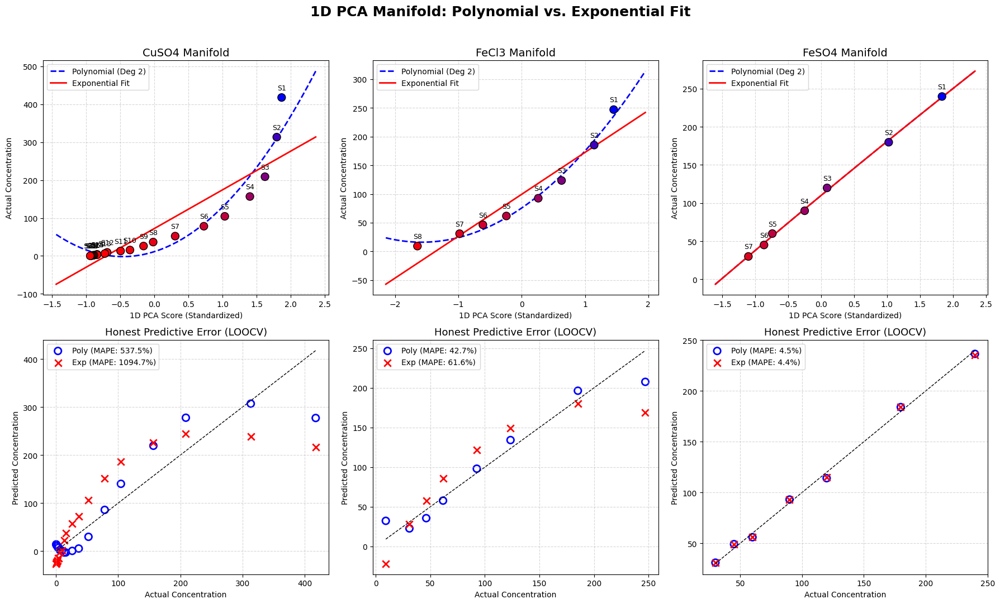

In [161]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import LeaveOneOut
from scipy.optimize import curve_fit
import warnings

warnings.filterwarnings("ignore")

# 1. Organize datasets
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}
# Define the Exponential Function to fit: y = a * e^(bx) + c
def exp_func(x, a, b, c):
    # Clip x to prevent math overflows if curve_fit tries extreme values during optimization
    x_safe = np.clip(x, -50, 50) 
    return a * np.exp(b * x_safe) + c

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle("1D PCA Manifold: Polynomial vs. Exponential Fit", fontsize=18, fontweight='bold', y=0.98)

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # ==========================================
    # LEAVE-ONE-OUT CROSS-VALIDATION (LOOCV)
    # ==========================================
    loo = LeaveOneOut()
    y_pred_poly = np.zeros_like(C_real)
    y_pred_exp = np.zeros_like(C_real)
    
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train = C_real[train_index]
        
        # 1. Base Transformation (PCA 1D + Standardization)
        pca = PCA(n_components=1)
        scaler = StandardScaler()
        
        X_pc1_train = scaler.fit_transform(pca.fit_transform(X_train))
        X_pc1_test = scaler.transform(pca.transform(X_test))
        
        # 2. Fit and Predict Polynomial
        poly = PolynomialFeatures(degree=2)
        lr = LinearRegression()
        lr.fit(poly.fit_transform(X_pc1_train), y_train)
        y_pred_poly[test_index] = lr.predict(poly.transform(X_pc1_test))
        
        # 3. Fit and Predict Exponential
        try:
            # We provide reasonable initial guesses [a, b, c] to help the optimizer converge
            p0_guess = [np.max(y_train), -1.0, np.min(y_train)]
            popt, _ = curve_fit(exp_func, X_pc1_train.flatten(), y_train, p0=p0_guess, maxfev=500000)
            y_pred_exp[test_index] = exp_func(X_pc1_test.flatten(), *popt)
        except RuntimeError:
            # Fallback if scipy fails to find an exponential fit for a specific fold
            y_pred_exp[test_index] = np.mean(y_train) 
            
    # Calculate LOOCV Error (MAPE)
    nonzero_mask = C_real != 0
    mape_poly = np.mean(np.abs((y_pred_poly[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    mape_exp = np.mean(np.abs((y_pred_exp[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100

    # ==========================================
    # PLOTTING ROW 1: Visualizing the Curves
    # ==========================================
    ax_top = axes[0, idx]
    
    # Fit everything on ALL data just for drawing the smooth visual lines
    pca_full = PCA(n_components=1)
    scaler_full = StandardScaler()
    X_pc1_full = scaler_full.fit_transform(pca_full.fit_transform(X))
    
    # Calculate Full Poly
    poly_full = PolynomialFeatures(degree=2)
    lr_full = LinearRegression().fit(poly_full.fit_transform(X_pc1_full), C_real)
    
    # Plot the scattered samples
    ax_top.scatter(X_pc1_full, C_real, c=colors, s=100, edgecolor='k', zorder=3)
    for i in range(len(C_real)):
        ax_top.annotate(f"S{i+1}", (X_pc1_full[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    # Generate the continuous x-axis line for smooth plotting
    x_line = np.linspace(X_pc1_full.min() - 0.5, X_pc1_full.max() + 0.5, 100).reshape(-1, 1)
    
    # Plot Poly Curve
    y_line_poly = lr_full.predict(poly_full.transform(x_line))
    ax_top.plot(x_line, y_line_poly, color='blue', linewidth=2, linestyle='--', zorder=2, label="Polynomial (Deg 2)")
    
    # Calculate Full Exp (With fixed maxfev and try-except safety)
    try:
        popt_full, _ = curve_fit(exp_func, X_pc1_full.flatten(), C_real, p0=[np.max(C_real), -1.0, np.min(C_real)], maxfev=50000)
        y_line_exp = exp_func(x_line.flatten(), *popt_full)
        ax_top.plot(x_line, y_line_exp, color='red', linewidth=2, linestyle='-', zorder=2, label="Exponential Fit")
    except RuntimeError:
        print(f"Warning: Could not converge an exponential fit for the {dataset_name} visual.")
    
    ax_top.set_title(f"{dataset_name} Manifold", fontsize=14)
    ax_top.set_xlabel(f"1D PCA Score (Standardized)")
    ax_top.set_ylabel("Actual Concentration")
    ax_top.grid(True, linestyle='--', alpha=0.5)
    ax_top.legend()

    # ==========================================
    # PLOTTING ROW 2: LOOCV Parity Plot
    # ==========================================
    ax_bot = axes[1, idx]
    
    # Plot LOOCV predictions for both models
    ax_bot.scatter(C_real, y_pred_poly, marker='o', s=80, facecolors='none', edgecolors='blue', linewidth=2, label=f'Poly (MAPE: {mape_poly:.1f}%)')
    ax_bot.scatter(C_real, y_pred_exp, marker='x', s=80, color='red', linewidth=2, label=f'Exp (MAPE: {mape_exp:.1f}%)')
    
    # Perfect fit line
    min_val, max_val = C_real.min(), C_real.max()
    ax_bot.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=1, zorder=1)
    
    ax_bot.set_title(f"Honest Predictive Error (LOOCV)", fontsize=13)
    ax_bot.set_xlabel("Actual Concentration")
    ax_bot.set_ylabel("Predicted Concentration")
    ax_bot.grid(True, linestyle='--', alpha=0.5)
    ax_bot.legend(loc='best')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

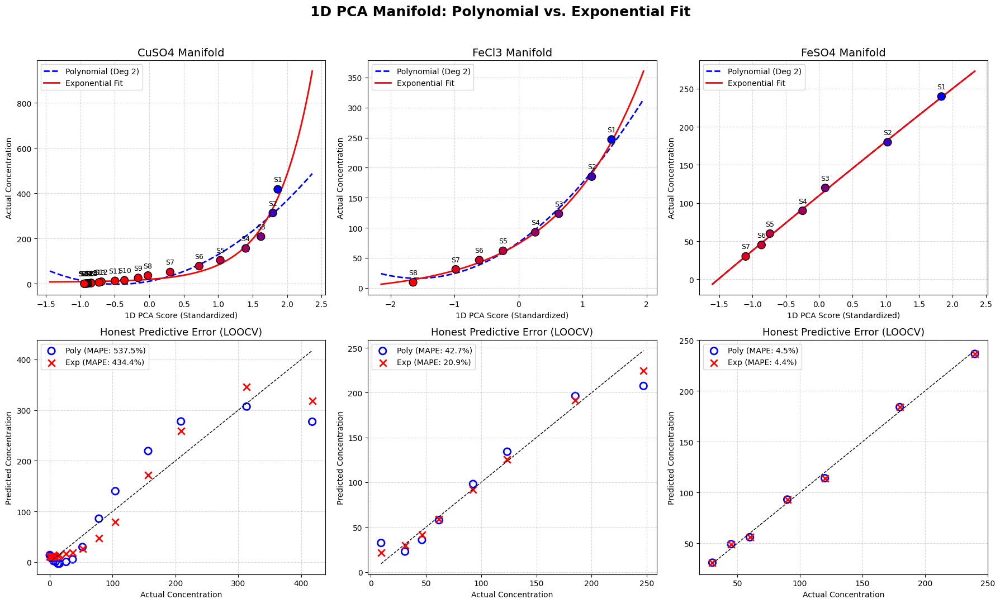

In [162]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import LeaveOneOut
from scipy.optimize import curve_fit
import warnings

warnings.filterwarnings("ignore")

# 1. Organize datasets
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

# Define the Exponential Function to fit: y = a * e^(bx) + c
def exp_func(x, a, b, c):
    x_safe = np.clip(x, -50, 50) 
    return a * np.exp(b * x_safe) + c

# Smart Wrapper to prevent curve_fit from getting stuck in a linear (b=0) local minimum
def robust_exp_fit(x, y):
    best_err = float('inf')
    best_popt = None
    
    # Since PCA directions are arbitrary, 'b' could be positive or negative.
    # We test multiple starting conditions and keep the one with the lowest error.
    y_range = np.max(y) - np.min(y)
    guesses = [
        [y_range, 1.0, np.min(y)],   # Guess 1: Positive steep exponential
        [y_range, -1.0, np.min(y)],  # Guess 2: Negative steep exponential
        [np.mean(y), 0.1, 0.0],      # Guess 3: Positive gentle exponential
        [np.mean(y), -0.1, 0.0]      # Guess 4: Negative gentle exponential
    ]
    
    for p0 in guesses:
        try:
            popt, _ = curve_fit(exp_func, x, y, p0=p0, maxfev=500000)
            err = np.sum((exp_func(x, *popt) - y)**2)
            if err < best_err:
                best_err = err
                best_popt = popt
        except RuntimeError:
            continue # Ignore failed guesses
            
    if best_popt is None:
        raise RuntimeError("Failed to converge on any exponential fit.")
    return best_popt

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle("1D PCA Manifold: Polynomial vs. Exponential Fit", fontsize=18, fontweight='bold', y=0.98)

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # ==========================================
    # LEAVE-ONE-OUT CROSS-VALIDATION (LOOCV)
    # ==========================================
    loo = LeaveOneOut()
    y_pred_poly = np.zeros_like(C_real)
    y_pred_exp = np.zeros_like(C_real)
    
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train = C_real[train_index]
        
        # 1. Base Transformation (PCA 1D + Standardization)
        pca = PCA(n_components=1)
        scaler = StandardScaler()
        
        X_pc1_train = scaler.fit_transform(pca.fit_transform(X_train))
        X_pc1_test = scaler.transform(pca.transform(X_test))
        
        # 2. Fit and Predict Polynomial
        poly = PolynomialFeatures(degree=2)
        lr = LinearRegression()
        lr.fit(poly.fit_transform(X_pc1_train), y_train)
        y_pred_poly[test_index] = lr.predict(poly.transform(X_pc1_test))
        
        # 3. Fit and Predict Exponential
        try:
            popt = robust_exp_fit(X_pc1_train.flatten(), y_train)
            y_pred_exp[test_index] = exp_func(X_pc1_test.flatten(), *popt)
        except RuntimeError:
            y_pred_exp[test_index] = np.mean(y_train) 
            
    # Calculate LOOCV Error (MAPE)
    nonzero_mask = C_real != 0
    mape_poly = np.mean(np.abs((y_pred_poly[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100
    mape_exp = np.mean(np.abs((y_pred_exp[nonzero_mask] - C_real[nonzero_mask]) / C_real[nonzero_mask])) * 100

    # ==========================================
    # PLOTTING ROW 1: Visualizing the Curves
    # ==========================================
    ax_top = axes[0, idx]
    
    # Fit everything on ALL data just for drawing the smooth visual lines
    pca_full = PCA(n_components=1)
    scaler_full = StandardScaler()
    X_pc1_full = scaler_full.fit_transform(pca_full.fit_transform(X))
    
    # Calculate Full Poly
    poly_full = PolynomialFeatures(degree=2)
    lr_full = LinearRegression().fit(poly_full.fit_transform(X_pc1_full), C_real)
    
    # Plot the scattered samples
    ax_top.scatter(X_pc1_full, C_real, c=colors, s=100, edgecolor='k', zorder=3)
    for i in range(len(C_real)):
        ax_top.annotate(f"S{i+1}", (X_pc1_full[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    # Generate the continuous x-axis line for smooth plotting
    x_line = np.linspace(X_pc1_full.min() - 0.5, X_pc1_full.max() + 0.5, 100).reshape(-1, 1)
    
    # Plot Poly Curve
    y_line_poly = lr_full.predict(poly_full.transform(x_line))
    ax_top.plot(x_line, y_line_poly, color='blue', linewidth=2, linestyle='--', zorder=2, label="Polynomial (Deg 2)")
    
    # Calculate Full Exp via the Robust Fitter
    try:
        popt_full = robust_exp_fit(X_pc1_full.flatten(), C_real)
        y_line_exp = exp_func(x_line.flatten(), *popt_full)
        ax_top.plot(x_line, y_line_exp, color='red', linewidth=2, linestyle='-', zorder=2, label="Exponential Fit")
    except RuntimeError:
        print(f"Warning: Could not converge an exponential fit for the {dataset_name} visual.")
    
    ax_top.set_title(f"{dataset_name} Manifold", fontsize=14)
    ax_top.set_xlabel(f"1D PCA Score (Standardized)")
    ax_top.set_ylabel("Actual Concentration")
    ax_top.grid(True, linestyle='--', alpha=0.5)
    ax_top.legend()

    # ==========================================
    # PLOTTING ROW 2: LOOCV Parity Plot
    # ==========================================
    ax_bot = axes[1, idx]
    
    # Plot LOOCV predictions for both models
    ax_bot.scatter(C_real, y_pred_poly, marker='o', s=80, facecolors='none', edgecolors='blue', linewidth=2, label=f'Poly (MAPE: {mape_poly:.1f}%)')
    ax_bot.scatter(C_real, y_pred_exp, marker='x', s=80, color='red', linewidth=2, label=f'Exp (MAPE: {mape_exp:.1f}%)')
    
    # Perfect fit line
    min_val, max_val = C_real.min(), C_real.max()
    ax_bot.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=1, zorder=1)
    
    ax_bot.set_title(f"Honest Predictive Error (LOOCV)", fontsize=13)
    ax_bot.set_xlabel("Actual Concentration")
    ax_bot.set_ylabel("Predicted Concentration")
    ax_bot.grid(True, linestyle='--', alpha=0.5)
    ax_bot.legend(loc='best')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [163]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.optimize import curve_fit
import ipywidgets as widgets
from IPython.display import display
import warnings

warnings.filterwarnings("ignore")

# ==========================================
# 1. Setup Data and Functions
# ==========================================
# Change this to 'FeCl3' or 'FeSO4' to explore the other datasets
dataset_name = 'CuSO4' 

datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

X = datasets[dataset_name]['X']
C_real = datasets[dataset_name]['C_real']

def exp_func(x, a, b, c):
    x_safe = np.clip(x, -50, 50) 
    return a * np.exp(b * x_safe) + c

def robust_exp_fit(x, y):
    best_err = float('inf')
    best_popt = None
    y_range = np.max(y) - np.min(y)
    guesses = [
        [y_range, 1.0, np.min(y)], [y_range, -1.0, np.min(y)],
        [np.mean(y), 0.1, 0.0], [np.mean(y), -0.1, 0.0]
    ]
    for p0 in guesses:
        try:
            popt, _ = curve_fit(exp_func, x, y, p0=p0, maxfev=50000)
            err = np.sum((exp_func(x, *popt) - y)**2)
            if err < best_err:
                best_err = err
                best_popt = popt
        except RuntimeError:
            continue
    return best_popt

# ==========================================
# 2. Fit the Forward Pipeline
# ==========================================
pca = PCA(n_components=1)
X_pc1_raw = pca.fit_transform(X)

scaler = StandardScaler()
X_pc1_scaled = scaler.fit_transform(X_pc1_raw).flatten()

popt = robust_exp_fit(X_pc1_scaled, C_real)
print(popt)

# ==========================================
# 3. Create a Stable Numerical Inverter
# ==========================================
x_dense = np.linspace(X_pc1_scaled.min() - 2, X_pc1_scaled.max() + 2, 5000)
c_dense = exp_func(x_dense, *popt)

# Sort for interpolation
sort_idx = np.argsort(c_dense)
c_dense_sorted = c_dense[sort_idx]
x_dense_sorted = x_dense[sort_idx]

# Identify min and max physical samples
min_idx = np.argmin(C_real)
max_idx = np.argmax(C_real)

# ==========================================
# 4. Interactive Widget Function
# ==========================================
def plot_reconstructed_spectra(pseudo_C):
    # Step A: Invert Concentration -> Scaled PCA Score
    x_target_scaled = np.interp(pseudo_C, c_dense_sorted, x_dense_sorted)
    
    # Step B: Invert Scaled -> Raw PCA Score
    x_target_raw = scaler.inverse_transform([[x_target_scaled]])
    
    # Step C: Invert Raw PCA -> 9000D Spectra
    X_reconstructed = pca.inverse_transform(x_target_raw).flatten()
    
    # --- Plotting ---
    plt.figure(figsize=(14, 7))
    
    # 1. Plot the permanent boundaries (Min and Max)
    plt.plot(X[min_idx], color='green', alpha=0.3, linewidth=1.5, 
             label=f'Min Actual (S{min_idx+1}: C = {C_real[min_idx]:.2f})')
    plt.plot(X[max_idx], color='red', alpha=0.3, linewidth=1.5, 
             label=f'Max Actual (S{max_idx+1}: C = {C_real[max_idx]:.2f})')
    
    # 2. Find and plot the nearest actual physical sample to current slider value
    closest_idx = np.argmin(np.abs(C_real - pseudo_C))
    if closest_idx not in [min_idx, max_idx]: # Don't double-plot if we are at the edges
        plt.plot(X[closest_idx], color='blue', alpha=0.4, linewidth=1.5, linestyle=':',
                 label=f'Nearest Actual (S{closest_idx+1}: C = {C_real[closest_idx]:.2f})')
    
    # 3. Plot the mathematically reconstructed spectrum
    plt.plot(X_reconstructed, color='black', linewidth=2.5, 
             label=f'PCA Reconstructed (pseudo-C = {pseudo_C:.2f})')
    
    plt.title(f"Navigating the {dataset_name} Latent Space", fontsize=16, fontweight='bold')
    plt.xlabel("Index (Wavelength/Frequency)", fontsize=12)
    plt.ylabel("Log Absorption", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(fontsize=11, loc='upper left')
    
    # Fix the Y-axis so the graph doesn't jump around when you slide
    plt.ylim(X.min() - 0.2, X.max() + 0.2) 
    plt.show()

# ==========================================
# 5. Display the Interactive Log Slider
# ==========================================
# FloatLogSlider uses exponents for min/max. 
# A min of np.log10(0.1) means the slider goes down to 10^(-1) = 0.1
safe_min = max(1e-5, C_real.min() * 0.9) 
safe_max = C_real.max() * 1.1

slider = widgets.FloatLogSlider(
    value=C_real.mean(),
    base=10,
    min=np.log10(safe_min), 
    max=np.log10(safe_max),
    step=0.005, # Extremely fine-grained steps
    description='Pseudo [C]:',
    readout_format='.2f', # Show standard numbers, not scientific notation
    layout=widgets.Layout(width='800px'),
    continuous_update=False 
)

widgets.interact(plot_reconstructed_spectra, pseudo_C=slider);

[12.13854672  1.83617327  7.67299573]


interactive(children=(FloatLogSlider(value=72.56013301875001, continuous_update=False, description='Pseudo [C]…

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.optimize import curve_fit
import ipywidgets as widgets
from IPython.display import display
import warnings

warnings.filterwarnings("ignore")

# ==========================================
# 1. Setup Data and Functions
# ==========================================
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

def exp_func(x, a, b, c):
    x_safe = np.clip(x, -50, 50) 
    return a * np.exp(b * x_safe) + c

def robust_exp_fit(x, y):
    best_err = float('inf')
    best_popt = None
    y_range = np.max(y) - np.min(y)
    guesses = [
        [y_range, 1.0, np.min(y)], [y_range, -1.0, np.min(y)],
        [np.mean(y), 0.1, 0.0], [np.mean(y), -0.1, 0.0]
    ]
    for p0 in guesses:
        try:
            popt, _ = curve_fit(exp_func, x, y, p0=p0, maxfev=50000)
            err = np.sum((exp_func(x, *popt) - y)**2)
            if err < best_err:
                best_err = err
                best_popt = popt
        except RuntimeError:
            continue
    return best_popt

# ==========================================
# 2. Precompute Math for ALL Datasets
# ==========================================
# We compute the PCA, scalers, and exp fits for all 3 upfront so the UI is lightning fast.
precomputed = {}
for name, data in datasets.items():
    X = data['X']
    C_real = data['C_real']
    
    pca = PCA(n_components=1)
    X_pc1_raw = pca.fit_transform(X)
    scaler = StandardScaler()
    X_pc1_scaled = scaler.fit_transform(X_pc1_raw).flatten()
    popt = robust_exp_fit(X_pc1_scaled, C_real)
    
    x_dense = np.linspace(X_pc1_scaled.min() - 2, X_pc1_scaled.max() + 2, 5000)
    c_dense = exp_func(x_dense, *popt)
    sort_idx = np.argsort(c_dense)
    
    precomputed[name] = {
        'X': X,
        'C_real': C_real,
        'pca': pca,
        'scaler': scaler,
        'c_dense_sorted': c_dense[sort_idx],
        'x_dense_sorted': x_dense[sort_idx],
        'min_idx': np.argmin(C_real),
        'max_idx': np.argmax(C_real)
    }

# ==========================================
# 3. Build UI Elements
# ==========================================
dropdown = widgets.Dropdown(options=list(datasets.keys()), value='CuSO4', description='Dataset:')

# Initialize slider bounds based on CuSO4
init_data = precomputed['CuSO4']
safe_min = max(1e-5, init_data['C_real'].min() * 0.9)
safe_max = init_data['C_real'].max() * 1.1

slider = widgets.FloatLogSlider(
    value=init_data['C_real'].mean(),
    base=10,
    min=np.log10(safe_min),
    max=np.log10(safe_max),
    step=0.005,
    description='Pseudo [C]:',
    readout_format='.2f',
    layout=widgets.Layout(width='800px'),
    continuous_update=False
)

# Output area for the plot
out = widgets.Output()

# ==========================================
# 4. Interactive Update Logic
# ==========================================
def update_plot(change=None):
    name = dropdown.value
    data = precomputed[name]
    
    # If the user changed the dataset dropdown, update the slider's min/max bounds dynamically
    if change and change['owner'] == dropdown:
        s_min = max(1e-5, data['C_real'].min() * 0.9)
        s_max = data['C_real'].max() * 1.1
        
        # Temporarily detach observer to prevent double-drawing while we change slider values
        slider.unobserve(update_plot, names='value') 
        slider.min = np.log10(s_min)
        slider.max = np.log10(s_max)
        slider.value = data['C_real'].mean()
        slider.observe(update_plot, names='value')

    pseudo_C = slider.value
    
    # Mathematical Inversions
    x_target_scaled = np.interp(pseudo_C, data['c_dense_sorted'], data['x_dense_sorted'])
    x_target_raw = data['scaler'].inverse_transform([[x_target_scaled]])
    X_reconstructed = data['pca'].inverse_transform(x_target_raw).flatten()
    
    # Plotting into the output widget
    with out:
        out.clear_output(wait=True)
        plt.figure(figsize=(14, 7))
        
        # Plot permanent physical boundaries
        plt.plot(data['X'][data['min_idx']], color='green', alpha=0.3, linewidth=1.5, 
                 label=f"Min Actual (S{data['min_idx']+1}: C = {data['C_real'][data['min_idx']]:.2f})")
        plt.plot(data['X'][data['max_idx']], color='red', alpha=0.3, linewidth=1.5, 
                 label=f"Max Actual (S{data['max_idx']+1}: C = {data['C_real'][data['max_idx']]:.2f})")
        
        # Plot nearest actual sample
        closest_idx = np.argmin(np.abs(data['C_real'] - pseudo_C))
        if closest_idx not in [data['min_idx'], data['max_idx']]:
            plt.plot(data['X'][closest_idx], color='blue', alpha=0.4, linewidth=1.5, linestyle=':',
                     label=f"Nearest Actual (S{closest_idx+1}: C = {data['C_real'][closest_idx]:.2f})")
        
        # Plot the reconstructed spectrum
        plt.plot(X_reconstructed, color='black', linewidth=2.5, 
                 label=f"PCA Reconstructed (pseudo-C = {pseudo_C:.2f})")
        
        plt.title(f"Navigating the Latent Space: {name}", fontsize=16, fontweight='bold')
        plt.xlabel("Index (Wavelength/Frequency)", fontsize=12)
        plt.ylabel("Log Absorption", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.legend(fontsize=11, loc='upper left')
        plt.ylim(data['X'].min() - 0.2, data['X'].max() + 0.2) 
        plt.show()

# Attach listeners
dropdown.observe(update_plot, names='value')
slider.observe(update_plot, names='value')

# Display UI
display(dropdown, slider, out)
update_plot() # Initial render

Dropdown(description='Dataset:', options=('CuSO4', 'FeCl3', 'FeSO4'), value='CuSO4')

FloatLogSlider(value=72.56013301875001, continuous_update=False, description='Pseudo [C]:', layout=Layout(widt…

Output()

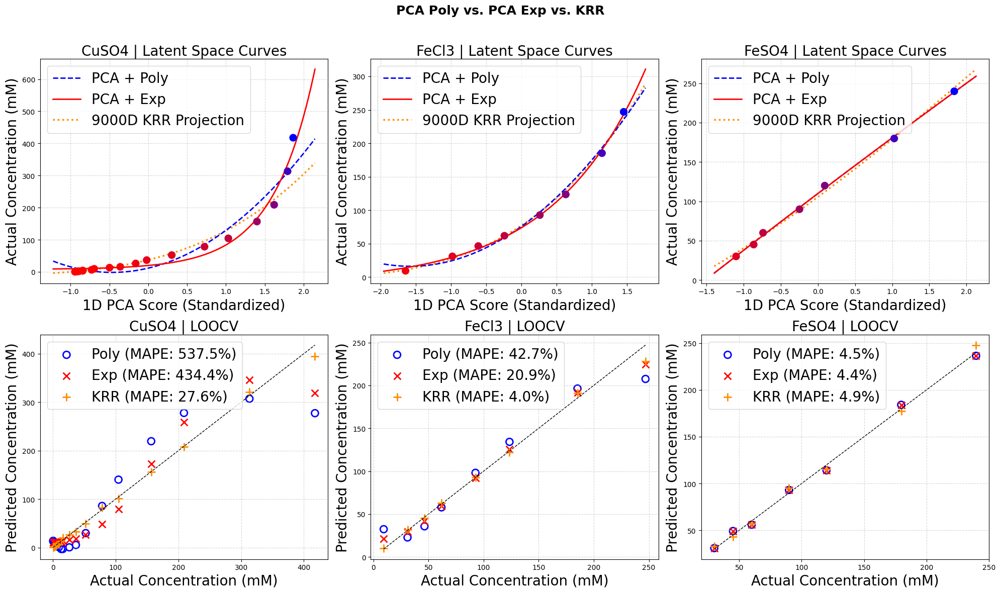

In [195]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import LeaveOneOut
from scipy.optimize import curve_fit
import warnings

warnings.filterwarnings("ignore")
fs = 20
# ==========================================
# 1. Setup Data and Functions
# ==========================================
datasets = {
    'CuSO4': {
        'X': data_matrix.T[:, :-cutoff], 
        'C_real': np.array(C_real_2), 
        'colors': c11
    },
    'FeCl3': {
        'X': data_matrix2.T[:, :-cutoff], 
        'C_real': np.array(C_real_1), 
        'colors': c12
    },
    'FeSO4': {
        'X': data_matrix3.T[:, :-cutoff], 
        'C_real': np.array(C_real_3), 
        'colors': c13
    }
}

dg1=2
dg2=4
gm = 0.001

def exp_func(x, a, b, c):
    x_safe = np.clip(x, -50, 50) 
    return a * np.exp(b * x_safe) + c

def robust_exp_fit(x, y):
    best_err = float('inf')
    best_popt = None
    y_range = np.max(y) - np.min(y)
    guesses = [
        [y_range, 1.0, np.min(y)], [y_range, -1.0, np.min(y)],
        [np.mean(y), 0.1, 0.0], [np.mean(y), -0.1, 0.0]
    ]
    for p0 in guesses:
        try:
            popt, _ = curve_fit(exp_func, x, y, p0=p0, maxfev=50000)
            err = np.sum((exp_func(x, *popt) - y)**2)
            if err < best_err:
                best_err = err
                best_popt = popt
        except RuntimeError:
            continue
    if best_popt is None:
        # Emergency fallback if all exponential guesses fail
        return [np.mean(y), 0, 0] 
    return best_popt

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle("PCA Poly vs. PCA Exp vs. KRR", fontsize=18, fontweight='bold', y=0.98)

for idx, (dataset_name, data) in enumerate(datasets.items()):
    X = data['X']
    C_real = data['C_real']
    colors = data['colors']
    
    # ==========================================
    # 2. Leave-One-Out Cross-Validation (LOOCV)
    # ==========================================
    loo = LeaveOneOut()
    y_pred_poly = np.zeros_like(C_real)
    y_pred_exp  = np.zeros_like(C_real)
    y_pred_krr  = np.zeros_like(C_real)
    
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train = C_real[train_index]
        
        # --- Base Transformations ---
        pca_cv = PCA(n_components=1)
        scaler_cv = StandardScaler()
        
        X_pc1_train = scaler_cv.fit_transform(pca_cv.fit_transform(X_train))
        X_pc1_test  = scaler_cv.transform(pca_cv.transform(X_test))
        
        # --- A. PCA + Polynomial Predict ---
        poly_cv = PolynomialFeatures(degree=dg1)
        lr_cv = LinearRegression().fit(poly_cv.fit_transform(X_pc1_train), y_train)
        y_pred_poly[test_index] = lr_cv.predict(poly_cv.transform(X_pc1_test))
        
        # --- B. PCA + Exponential Predict ---
        popt_cv = robust_exp_fit(X_pc1_train.flatten(), y_train)
        y_pred_exp[test_index] = exp_func(X_pc1_test.flatten(), *popt_cv)
            
        # --- C. 9000D KRR Predict ---
        #krr_cv = KernelRidge(kernel='poly', degree=dg2, alpha=1.0).fit(X_train, y_train)
        krr_cv  = KernelRidge(kernel='polynomial', gamma=gm,degree=dg2, alpha=1.0).fit(X_train, y_train)
        
        y_pred_krr[test_index] = krr_cv.predict(X_test)
            
    # Calculate LOOCV Error (MAPE)
    nz = C_real != 0 # Non-zero mask
    mape_poly = np.mean(np.abs((y_pred_poly[nz] - C_real[nz]) / C_real[nz])) * 100
    mape_exp  = np.mean(np.abs((y_pred_exp[nz]  - C_real[nz]) / C_real[nz])) * 100
    mape_krr  = np.mean(np.abs((y_pred_krr[nz]  - C_real[nz]) / C_real[nz])) * 100

    # ==========================================
    # 3. Fit Final Models for Visual Curves
    # ==========================================
    # Fit base 1D space
    pca_full = PCA(n_components=1)
    scaler_full = StandardScaler()
    X_pc1_raw = pca_full.fit_transform(X)
    X_pc1_scaled = scaler_full.fit_transform(X_pc1_raw).flatten()
    
    # Train full models
    poly_full = PolynomialFeatures(degree=2)
    lr_full = LinearRegression().fit(poly_full.fit_transform(X_pc1_scaled.reshape(-1, 1)), C_real)
    popt_full = robust_exp_fit(X_pc1_scaled, C_real)
    #krr_full = KernelRidge(kernel='poly', degree=2, alpha=1.0).fit(X, C_real)
    krr_full = KernelRidge(kernel='polynomial', gamma=gm,degree= dg2, alpha=1.0).fit(X, C_real)
    
    # Generate continuous smooth 1D line for plotting
    pad = (X_pc1_scaled.max() - X_pc1_scaled.min()) * 0.1
    x_line_scaled = np.linspace(X_pc1_scaled.min() - pad, X_pc1_scaled.max() + pad, 200)
    x_line_scaled_col = x_line_scaled.reshape(-1, 1)
    
    # Generate mathematical curves
    y_line_poly = lr_full.predict(poly_full.transform(x_line_scaled_col))
    y_line_exp  = exp_func(x_line_scaled, *popt_full)
    
    # KRR Projection Math: 1D Scaled -> 1D Raw -> 9000D -> KRR Model
    x_line_raw = scaler_full.inverse_transform(x_line_scaled_col)
    X_line_9000D = pca_full.inverse_transform(x_line_raw)
    y_line_krr = krr_full.predict(X_line_9000D)

    # ==========================================
    # 4. PLOTTING
    # ==========================================
    ax_curve = axes[0,idx]
    ax_cv    = axes[1, idx]
    
    # --- Left Plot: 1D Manifold Curves ---
    ax_curve.scatter(X_pc1_scaled, C_real, c=colors, s=100, zorder=4)
    #for i in range(len(C_real)):
    #    ax_curve.annotate(f"S{i+1}", (X_pc1_scaled[i], C_real[i]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
        
    ax_curve.plot(x_line_scaled, y_line_poly, color='blue', linewidth=2, linestyle='--', zorder=2, label="PCA + Poly")
    ax_curve.plot(x_line_scaled, y_line_exp, color='red', linewidth=2, linestyle='-', zorder=3, label="PCA + Exp")
    ax_curve.plot(x_line_scaled, y_line_krr, color='darkorange', linewidth=2.5, linestyle=':', zorder=1, label="9000D KRR Projection")
    
    ax_curve.set_title(f"{dataset_name} | Latent Space Curves",fontsize= fs)
    ax_curve.set_xlabel(f"1D PCA Score (Standardized)",fontsize= fs)
    ax_curve.set_ylabel("Actual Concentration (mM)",fontsize= fs)
    ax_curve.grid(True, linestyle='--', alpha=0.5)
    ax_curve.legend(loc='upper left',fontsize= fs)

    # --- Right Plot: LOOCV Parity ---
    ax_cv.scatter(C_real, y_pred_poly, marker='o', s=100, facecolors='none', edgecolors='blue', linewidth=2, label=f'Poly (MAPE: {mape_poly:.1f}%)')
    ax_cv.scatter(C_real, y_pred_exp, marker='x', s=100, color='red', linewidth=2, label=f'Exp (MAPE: {mape_exp:.1f}%)')
    ax_cv.scatter(C_real, y_pred_krr, marker='+', s=120, color='darkorange', linewidth=2, label=f'KRR (MAPE: {mape_krr:.1f}%)')
    
    min_val, max_val = C_real.min(), C_real.max()
    ax_cv.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=1, zorder=1)
    
    ax_cv.set_title(f"{dataset_name} | LOOCV",fontsize= fs)
    ax_cv.set_xlabel("Actual Concentration (mM)",fontsize= fs)
    ax_cv.set_ylabel("Predicted Concentration (mM)",fontsize= fs)
    ax_cv.grid(True, linestyle='--', alpha=0.5)
    ax_cv.legend(loc='best',fontsize= fs)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()